# GUC NETW 1003 Kmeans Assginmnet 

Objective: exercise is to learn how to use build and use  kmeans clustering algortrithm    

At the end of this lab you will be able to
> 1. Build and run a K-means algorithm.
> 2. Know how to evalute K-means Algorithm 
> 2. Understand the effect of the parmeters ont he perfromance of the algorithm .
> 3. Understand the effect of distance.

## 1. Wirte K means function 

import required libraries 

In [38]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.datasets import make_moons
import csv


> ### 1.1. Code for the distance function 

write a function to calculate the distance between a set of cluster centroids and all the data points 

Cluster_Distances = GUC_Distance ( Cluster_Centroids, Data_points, Distance_Type) 
* The function shoud be able to handel data points with any number of features and any number of points 
* The function should be able to handle any K number of cluster centroids 
* To inrease speed do that in matrix format using numpy
* This should produce a matrix with rows equal to data points columns equal K 
* You should be able to calculate different types of Distance. In this assginmnet you are required to implement the following two 
    - Ecluidian distance
    - Pearson correlation distance
  

In [39]:
def euclidean_distance(point1, point2):
    return np.sqrt(np.sum((point1 - point2)**2))

def pearson_correlation_distance(point1, point2):
    covariance = np.cov(point1, point2)
    correlation = covariance[0, 1] / np.sqrt(covariance[0, 0] * covariance[1, 1])
    return 1 - correlation

def GUC_Distance(Cluster_Centroids, Data_points, Distance_Type):
    if Distance_Type == 'euclidean':
        distance_func = euclidean_distance
    elif Distance_Type == 'pearson':
        distance_func = pearson_correlation_distance
    else:
        raise ValueError("Distance type not supported.")
    
    num_centroids = len(Cluster_Centroids)
    num_points = len(Data_points)
    
    distances = np.zeros((num_points, num_centroids))
    
    for i in range(num_points):
        for j in range(num_centroids):
            distances[i, j] = distance_func(Cluster_Centroids[j], Data_points[i])
    
    return distances

> ### 1.2. Code for K means function 

In [40]:
with open('Customer data.csv', 'r') as f:
    reader = csv.reader(f)
    data = list(reader)
##print(data)
data_array = np.array(data[1:], dtype=float)

print(data_array)
def initiate_centroids(Data_Array,no_of_clusters):
    min_of_columns=np.min(Data_Array,axis=0)
    max_of_columns=np.max(Data_Array,axis=0)
    range_of_columns=max_of_columns-min_of_columns

    initial_centroids=np.zeros((no_of_clusters,Data_Array.shape[1]))
    for i in range(Data_Array.shape[1]):
        min_val=min_of_columns[i]
        max_val=max_of_columns[i]
        initial_centroids[:,i]=np.random.uniform(min_val, max_val, size=no_of_clusters)

    return initial_centroids
print(initiate_centroids(data_array,3))

[[1.00000001e+08 0.00000000e+00 0.00000000e+00 ... 1.24670000e+05
  1.00000000e+00 2.00000000e+00]
 [1.00000002e+08 1.00000000e+00 1.00000000e+00 ... 1.50773000e+05
  1.00000000e+00 2.00000000e+00]
 [1.00000003e+08 0.00000000e+00 0.00000000e+00 ... 8.92100000e+04
  0.00000000e+00 0.00000000e+00]
 ...
 [1.00001998e+08 0.00000000e+00 0.00000000e+00 ... 8.64000000e+04
  0.00000000e+00 0.00000000e+00]
 [1.00001999e+08 1.00000000e+00 1.00000000e+00 ... 9.79680000e+04
  0.00000000e+00 0.00000000e+00]
 [1.00002000e+08 0.00000000e+00 0.00000000e+00 ... 6.84160000e+04
  0.00000000e+00 0.00000000e+00]]
[[1.00001254e+08 7.59137221e-01 5.72018699e-01 4.19348726e+01
  7.84949335e-01 4.25151727e+04 1.03323770e+00 1.16310475e+00]
 [1.00000393e+08 4.84977706e-01 8.84401178e-01 4.53380390e+01
  1.34508013e+00 7.41800611e+04 1.71664197e+00 1.33879383e-01]
 [1.00000990e+08 7.82421903e-02 8.27039982e-01 3.39198076e+01
  6.20621889e-01 1.02386682e+05 1.99110395e+00 3.44417053e-01]]


> Loop until a stopping condition 

> > in the loop do the following 
> > 1. Cluster Assginmnet 
> > > * Use the GUC_Distance to calculate between each cluster head and all the points 
> > > * Find the value and index of the minimum distance  for each row. 
> > > * for each point in the row use the index of the minmum distance to represent the cluster Centroid that this point will belong to.
> > > * Calculate and record the mean square distance for each cluster  
> > > * Use the mean square distances to calculate a stopping condition (e.g the sum of mean distances)
> > 2. Updtate Centroids  
> > > * Update the value for the cluster heads by calculating the mean value for the points in each cluster 
> > >  * Calculate the Cluster Metric (Distortion Function)
> > > > a number indicating the how good the clusters are . An example cluster metric is the  (sum of squared error between each point and its cluster center) 

In [41]:
def GUC_Kmean ( Data_points, Number_of_Clusters,  Distance_Type ):
    initial_centroids=initiate_centroids(Data_points,Number_of_Clusters)
    centroids=initial_centroids
    for ii in range(50):
        MSE=np.zeros(Number_of_Clusters)
        #print(MSE)
        #print(centroids)
        points2clusters=np.zeros((Data_points.shape[0],2))
        # write your your loop 
        distances=GUC_Distance(initial_centroids,Data_points,Distance_Type)
        #print(distances)
        for i in range(Data_points.shape[0]):
            points2clusters[i,0]=np.argmin(distances[i])
            points2clusters[i,1]=np.min(distances[i])
        #print(points2clusters)

        for j in range(Number_of_Clusters):
            cluster_points_indeces=np.where(points2clusters[:,0]==j)[0]
            cluster_points=Data_points[cluster_points_indeces]
        
            #calculating mean square error for each cluster
            cluster_distance=np.linalg.norm(cluster_points - centroids[j], axis=1)
            squared_distance=cluster_distance**2
            MSE[j]=np.mean(squared_distance)
            if (np.size(cluster_points)!=0):
                centroids[j]=np.mean(cluster_points,axis=0)


        #print(centroids[j])
        #print("epoch :")
        #print(np.mean(MSE))
        
        #checking if the average mean square error has become below the threshold
        if (np.mean(MSE)<208713094):
            break

    return [ points2clusters , np.mean(MSE) ]  
    

points2clusters,MSE=GUC_Kmean(data_array,5,'euclidean') 
print(points2clusters)
print(MSE)

[[1.00000000e+00 1.04072786e+03]
 [3.00000000e+00 1.30940509e+04]
 [2.00000000e+00 2.20926856e+03]
 ...
 [2.00000000e+00 1.24557491e+03]
 [2.00000000e+00 1.06557050e+04]
 [2.00000000e+00 1.89450023e+04]]
200469587.2253096


## 2. Display Results 

* below is a an example fuction that displayes Clusters in 2D 

* You need to change the function so that is can display an n dimension data in the form of pairs of subplot 2D figures 

* The function is a helper function that is originaly be found in 
https://www.coursera.org/learn/ibm-unsupervised-learning/


In [42]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt

> #### 2.1. helper Display function 

In [43]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

> #### 2.2. Example 1 : Circular Data Gen and display 

* below is an example of how to use the funciton 
  *  prepare the figure size and background 
   > * this part can be replaced by a number of subplots 
  
  * Produce a data set that represent the x and y o coordinates of a circle 
   > * this part can be replaced by data that you import froma file 
  
  * Data is displayed 
   > * to display the data only it is assumed that the number of clusters is zero which is the default of the fuction 

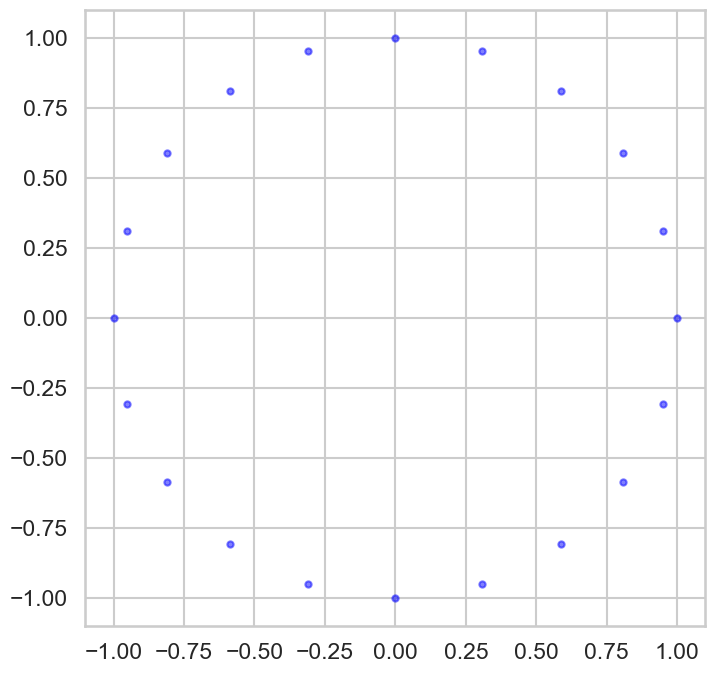

In [44]:
# prepare the figure sise and background 
# this part can be replaced by a number of subplots 
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")
# Produce a data set that represent the x and y o coordinates of a circle 
# this part can be replaced by data that you import froma file 
angle = np.linspace(0,2*np.pi,20, endpoint = False)
X = np.append([np.cos(angle)],[np.sin(angle)],0).transpose()
# Data is displayed 
# to display the data only it is assumed that the number of clusters is zero which is the default of the fuction 
display_cluster(X)

> #### 2.3. Example 2 : Multi blob Data Gen and display 

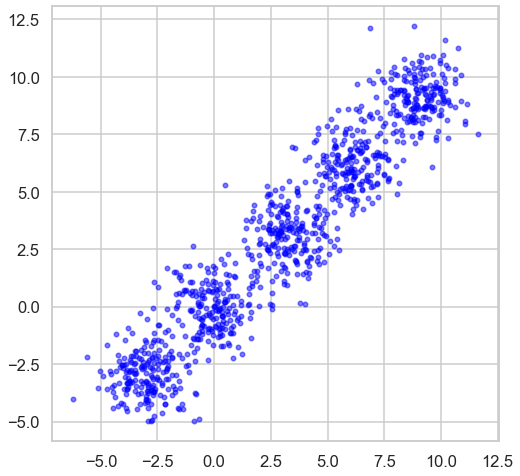

In [ ]:
n_samples = 1000
n_bins = 4  
centers = [(-3, -3), (0, 0), (3, 3), (6, 6), (9,9)]
X, y = make_blobs(n_samples=n_samples, n_features=2, cluster_std=1.0,
                  centers=centers, shuffle=False, random_state=42)
display_cluster(X)

#### 2.3. Example 3 : moons Data Gen and display 

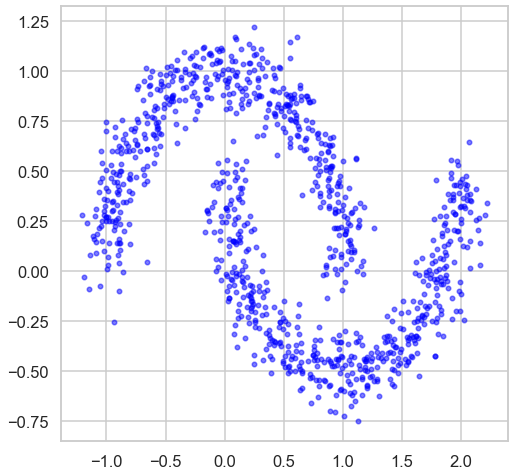

In [ ]:
n_samples = 1000
X, y = noisy_moons = make_moons(n_samples=n_samples, noise= .1)
display_cluster(X)

## 3. Testing the GUC_Kmean function on Simple 2D
1. Apply the GUC_Kmean fucntion to 2D Data provided by example 1, Example 2 and Example 3
2. Try a varing number of cluster centriods that range from 2 to 10 clusters on each set 
3. Display your results.
4. plot the Cluster perfromance Metric versus the number of clusters
4. Change the distance function and repeat the above steps 

In [49]:
def display(Data_array,points2clusters,N_clusters):
    points2clusters=points2clusters[:,0]
    print(points2clusters)
    color = 'brgcmykbrgcmykbrgcmykbrgcmykbrg'
  #List colors
    alpha = 0.5  #color obaque
    s = 20

    fig, axs = plt.subplots(Data_array.shape[1], Data_array.shape[1],figsize=(20,20))
    
    for i in range(Data_array.shape[1]):
        for j in range(Data_array.shape[1]):
            for k in range(N_clusters):
                x=Data_array[points2clusters==k,i]
                y=Data_array[points2clusters==k,j]
                axs[i,j].scatter(x,y,color=color[k],alpha=alpha,s=s)
                
    return



2 clusters, for euclidean
[[0.         0.77103197]
 [0.         0.60091421]
 [0.         0.47087566]
 [0.         0.43590274]
 [0.         0.51871387]
 [0.         0.67167275]
 [1.         0.82145318]
 [1.         0.75976981]
 [1.         0.72702124]
 [1.         0.73039761]
 [1.         0.76911041]
 [1.         0.83488202]
 [1.         0.91632166]
 [1.         1.00270764]
 [1.         1.085418  ]
 [1.         1.15795865]
 [1.         1.21560721]
 [1.         1.25508409]
 [0.         1.11578636]
 [0.         0.94818513]]
0.7236245462738913
[0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0.]
3 clusters, for euclidean
[[2.         0.58197899]
 [2.         0.74107036]
 [2.         0.91287067]
 [1.         1.00259365]
 [1.         0.99030902]
 [1.         0.97891246]
 [1.         0.96956888]
 [1.         0.96326357]
 [1.         0.96067748]
 [0.         0.79729101]
 [0.         0.51483309]
 [0.         0.22488296]
 [0.         0.11500226]
 [0.         0.39581359]
 [0.         0.6

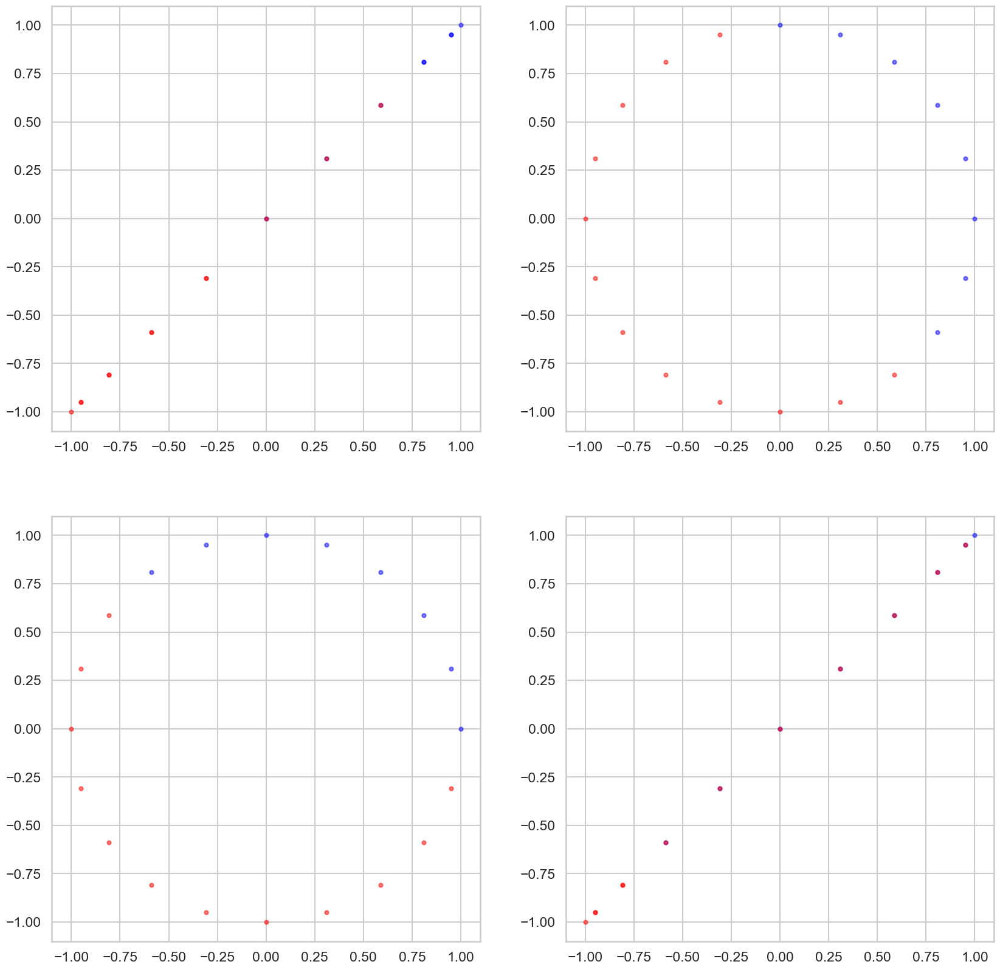

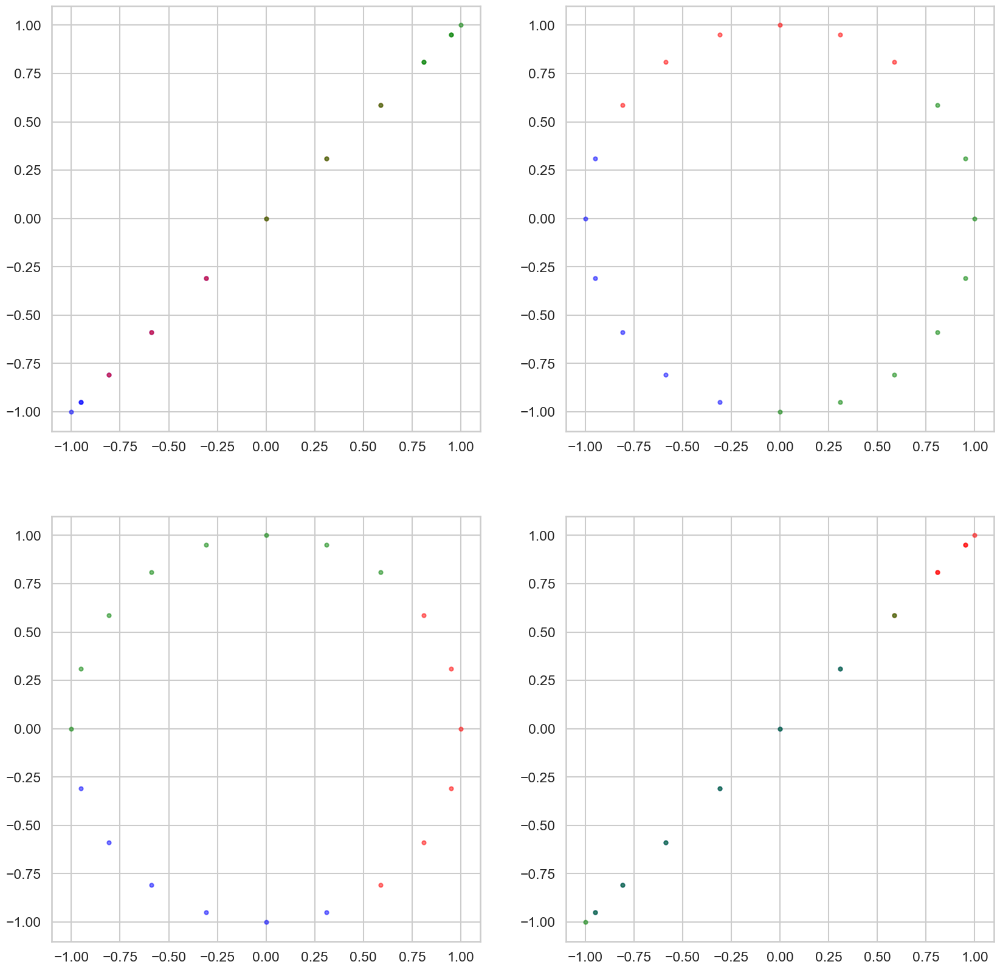

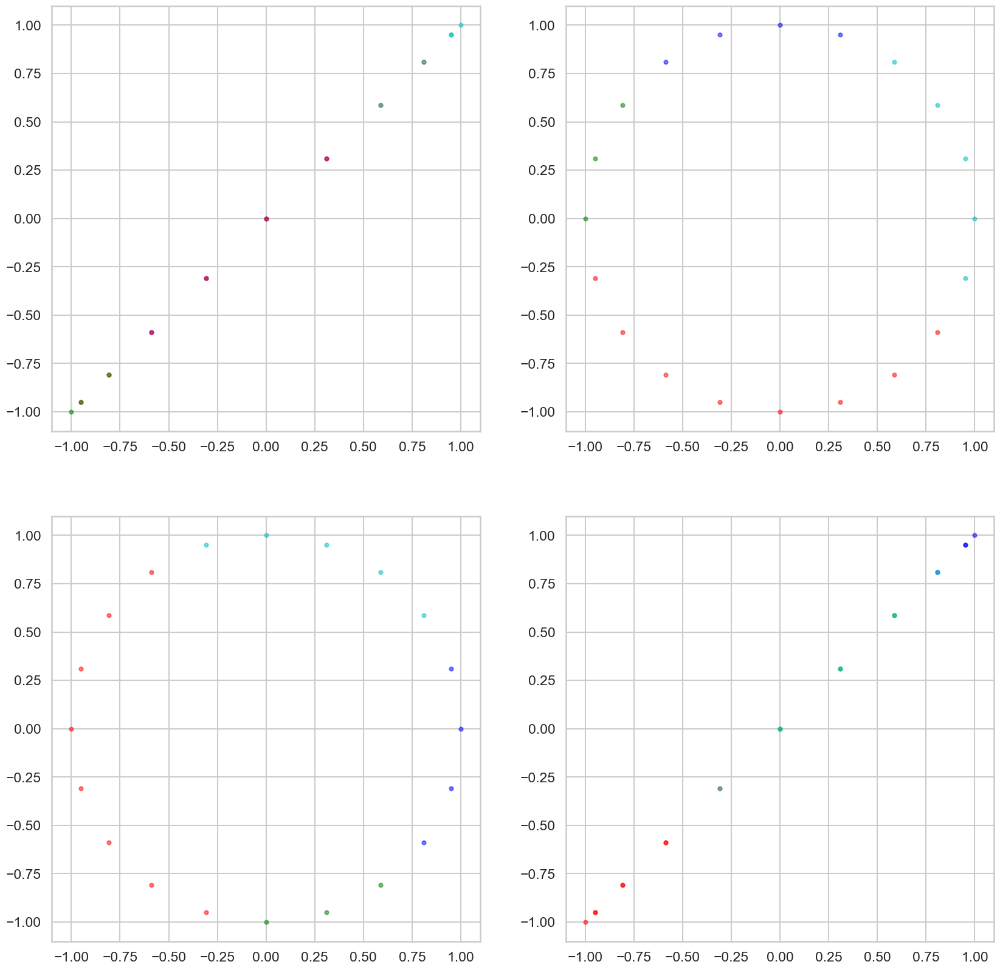

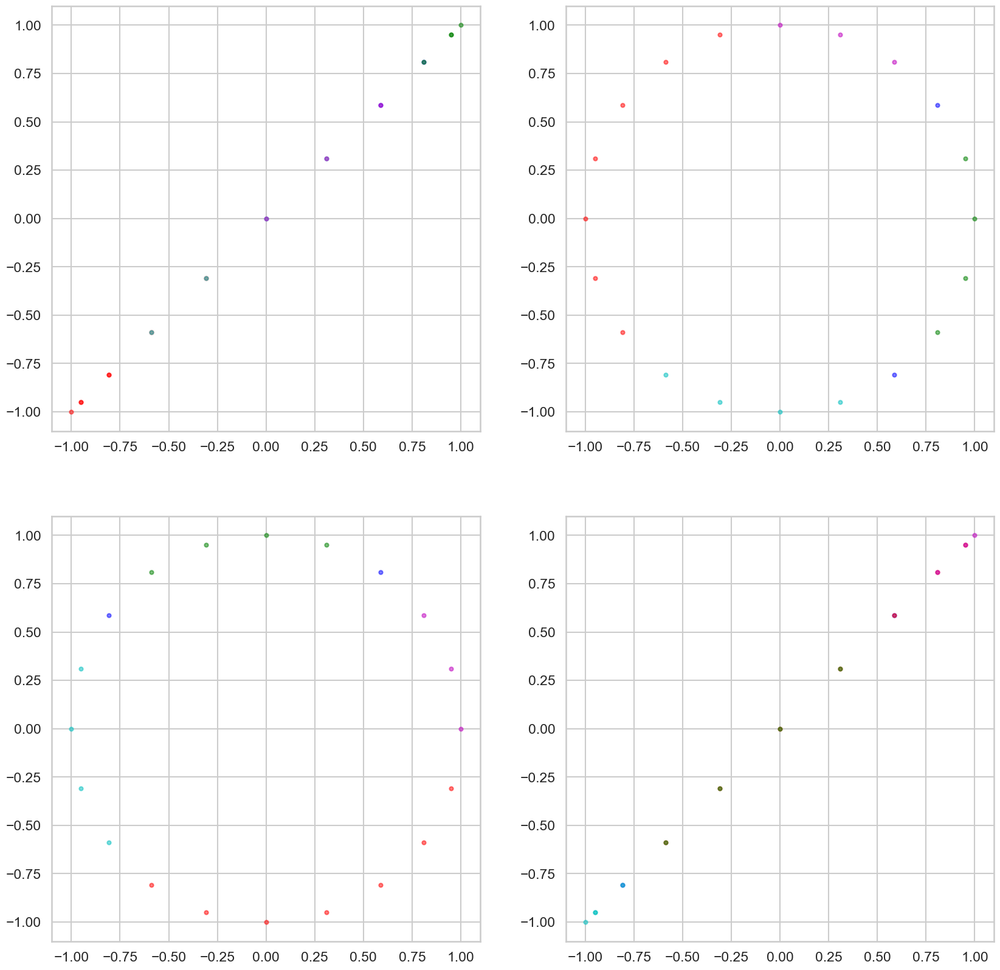

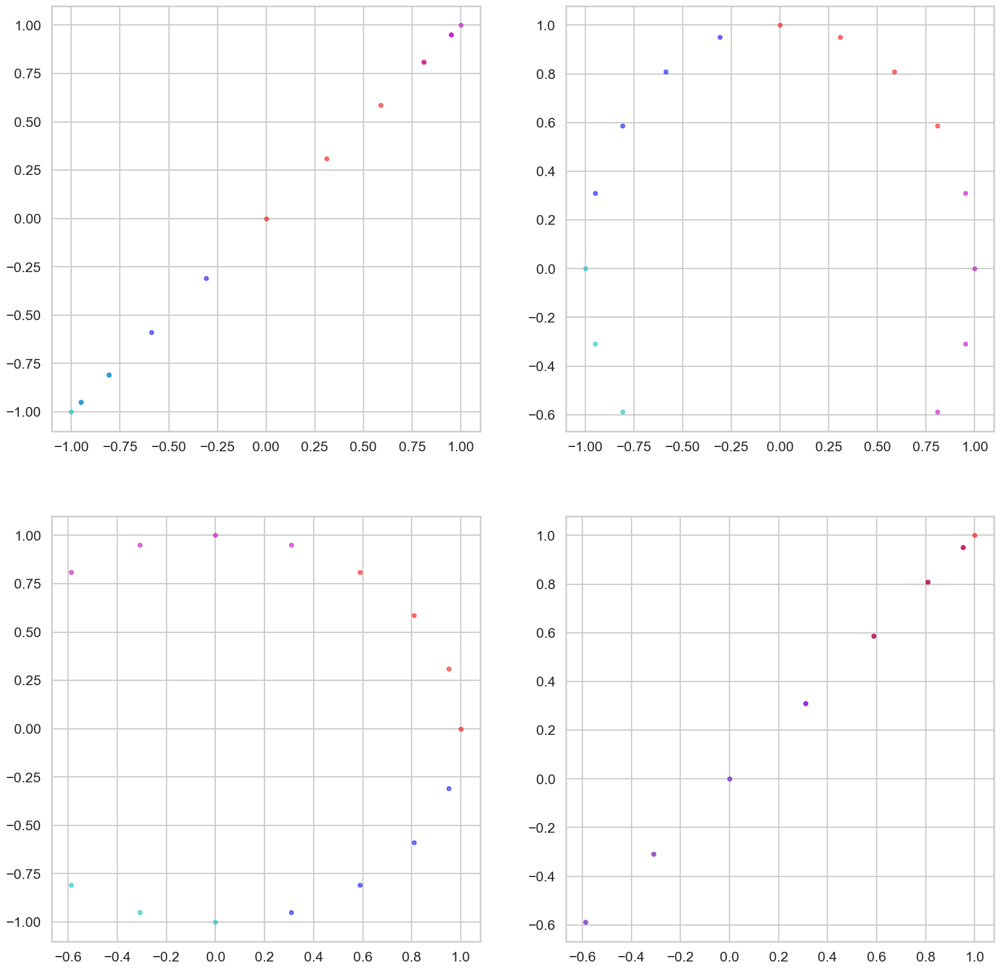

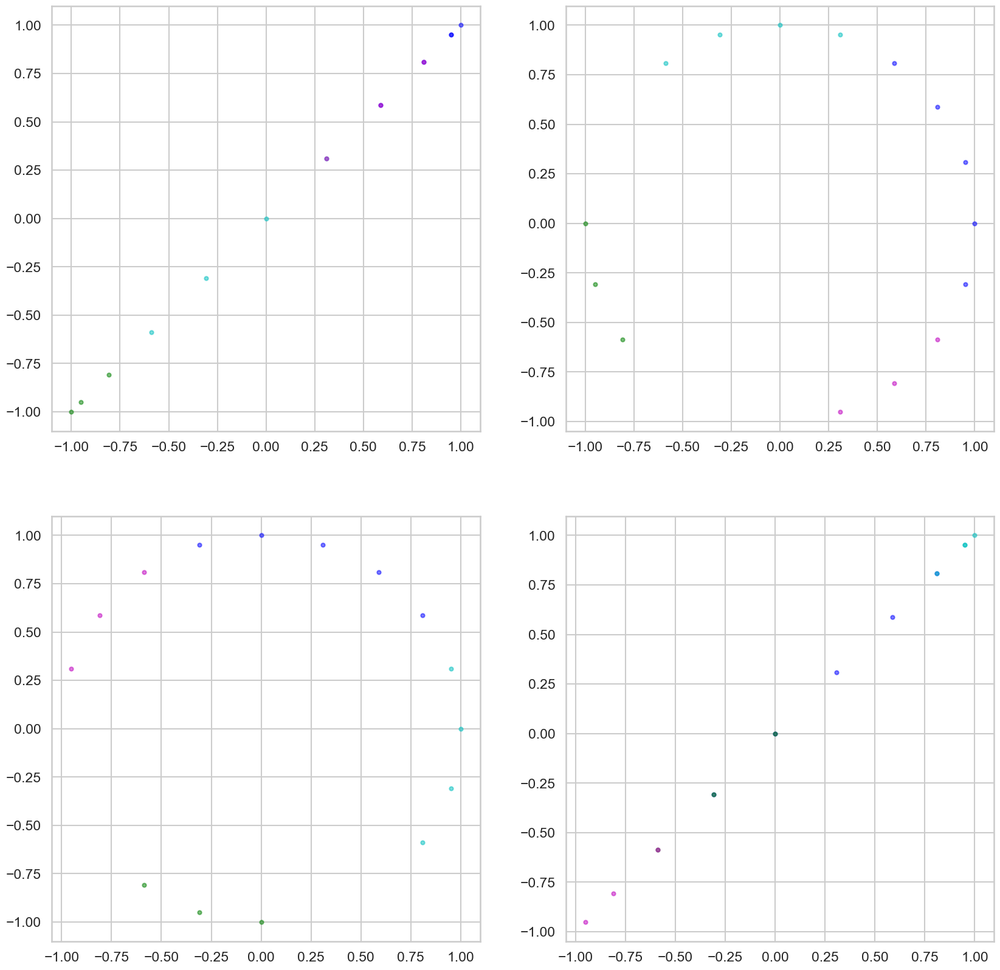

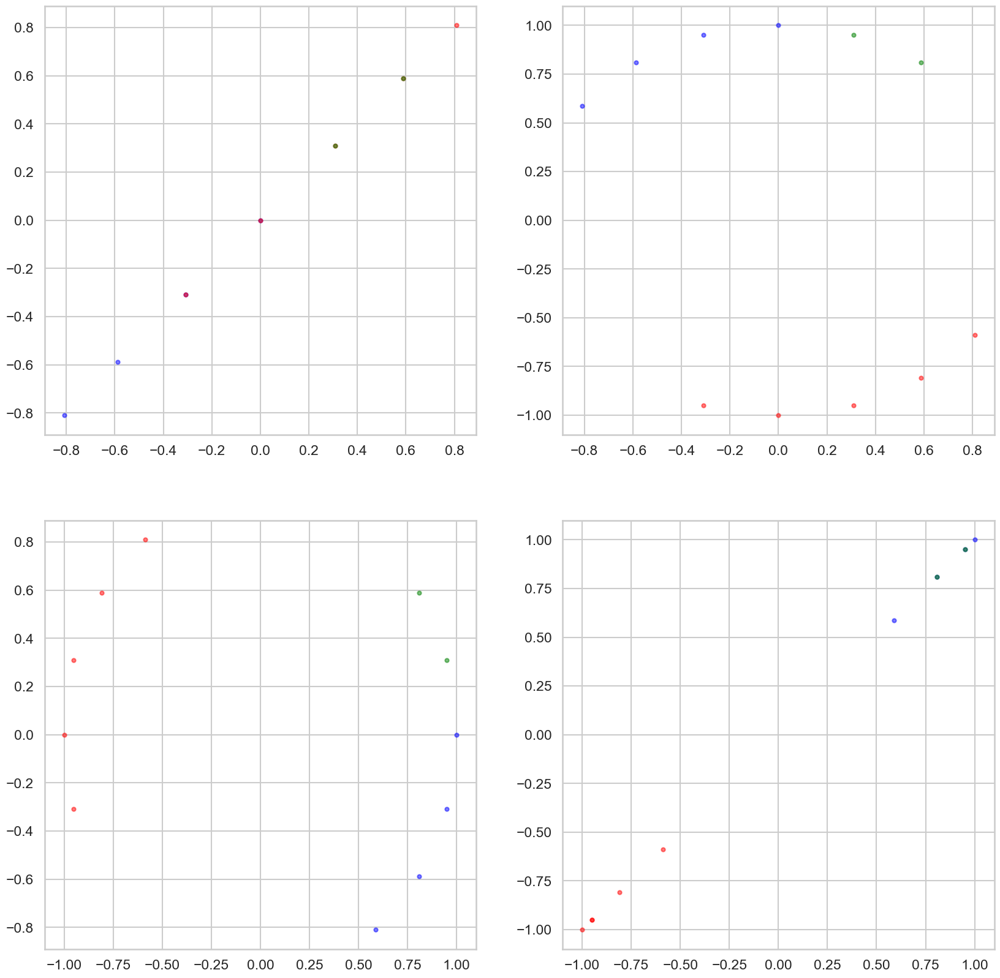

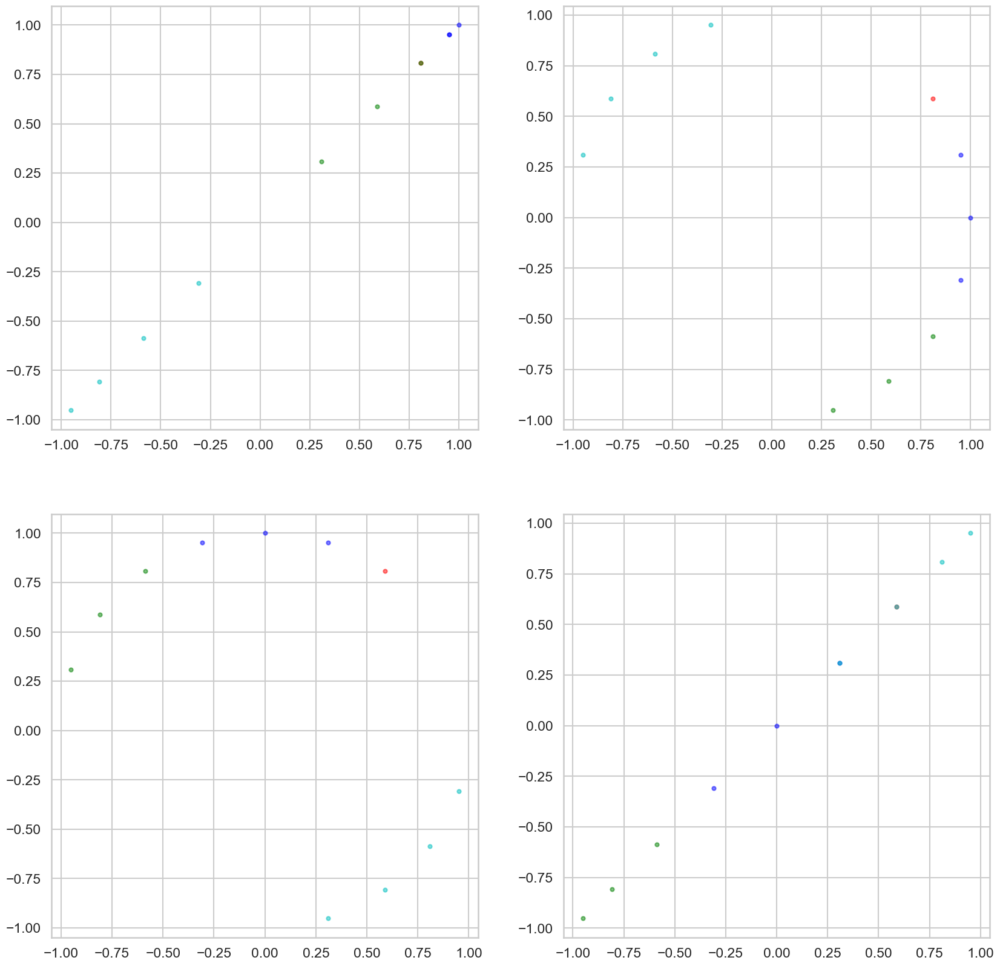

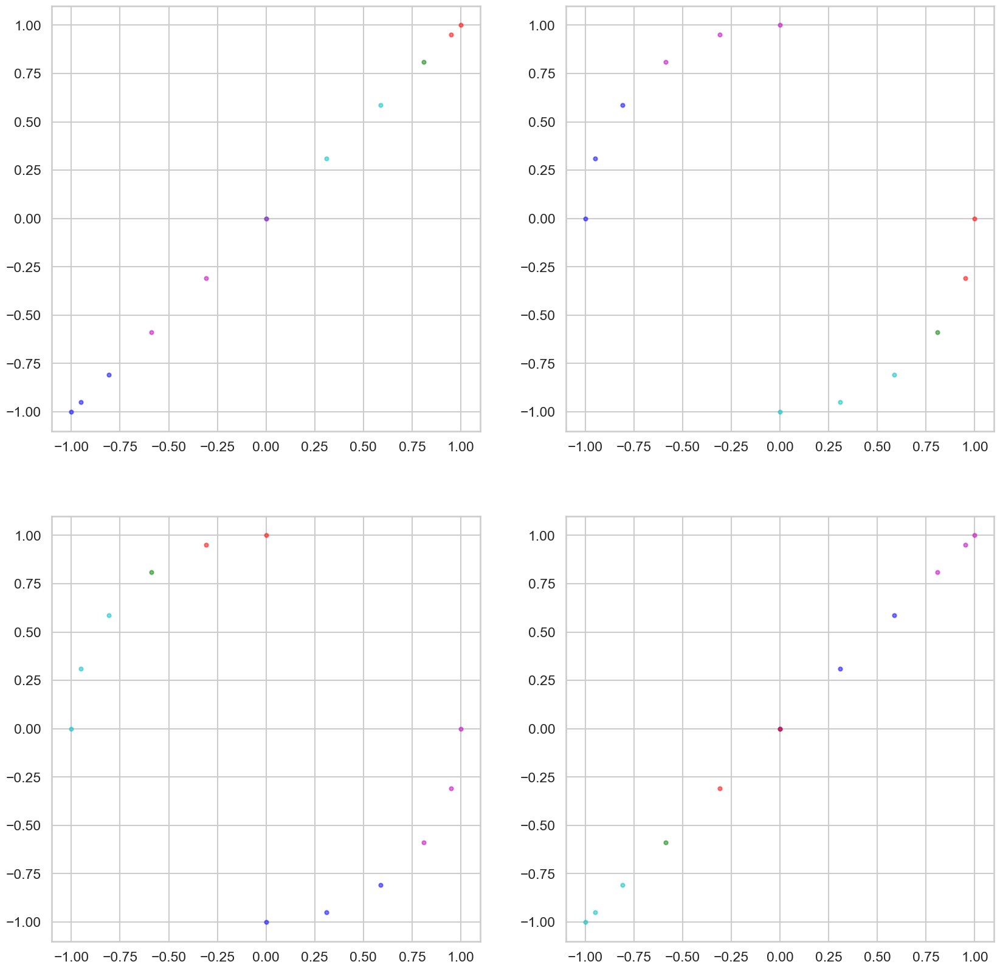

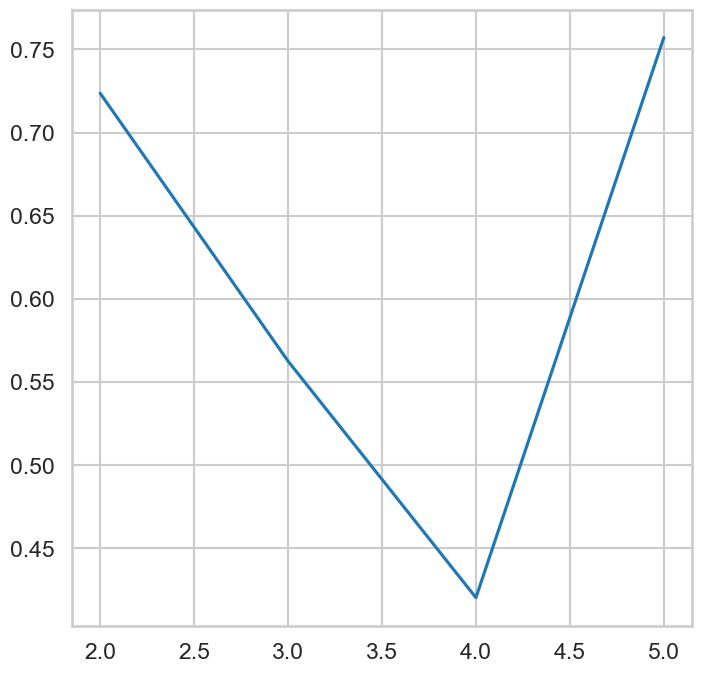

In [50]:
MSE_arr=np.array([])
angle = np.linspace(0,2*np.pi,20, endpoint = False)

data1= np.append([np.cos(angle)],[np.sin(angle)],0).transpose()
for i in range(2,11):
    print(i,"clusters, for euclidean")
    points2clusters,MSE=GUC_Kmean(data1,i,'euclidean') 
    print(points2clusters)
    print(MSE)
    MSE_arr=np.append(MSE_arr,MSE)
    display(data1,points2clusters,k)
x_values = np.arange(2, 2 + MSE_arr.shape[0])
plt.figure()
plt.plot(x_values,MSE_arr)





2 clusters, for euclidean
[[0.         0.55132362]
 [0.         0.47217642]
 [0.         0.52652312]
 ...
 [0.         1.14854372]
 [0.         1.23069061]
 [0.         1.31286687]]
0.9313791098066457
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 1. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0. 0. 0.
 1. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 1. 0. 1. 1. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 1. 1. 0. 1. 0. 0. 0. 1. 1. 0. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 1. 0. 1. 0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1.
 1. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 0. 0. 1. 0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 1.
 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 1. 1.
 0. 0. 0. 0. 0. 1. 1. 0. 0. 1. 0. 1. 0. 1. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.

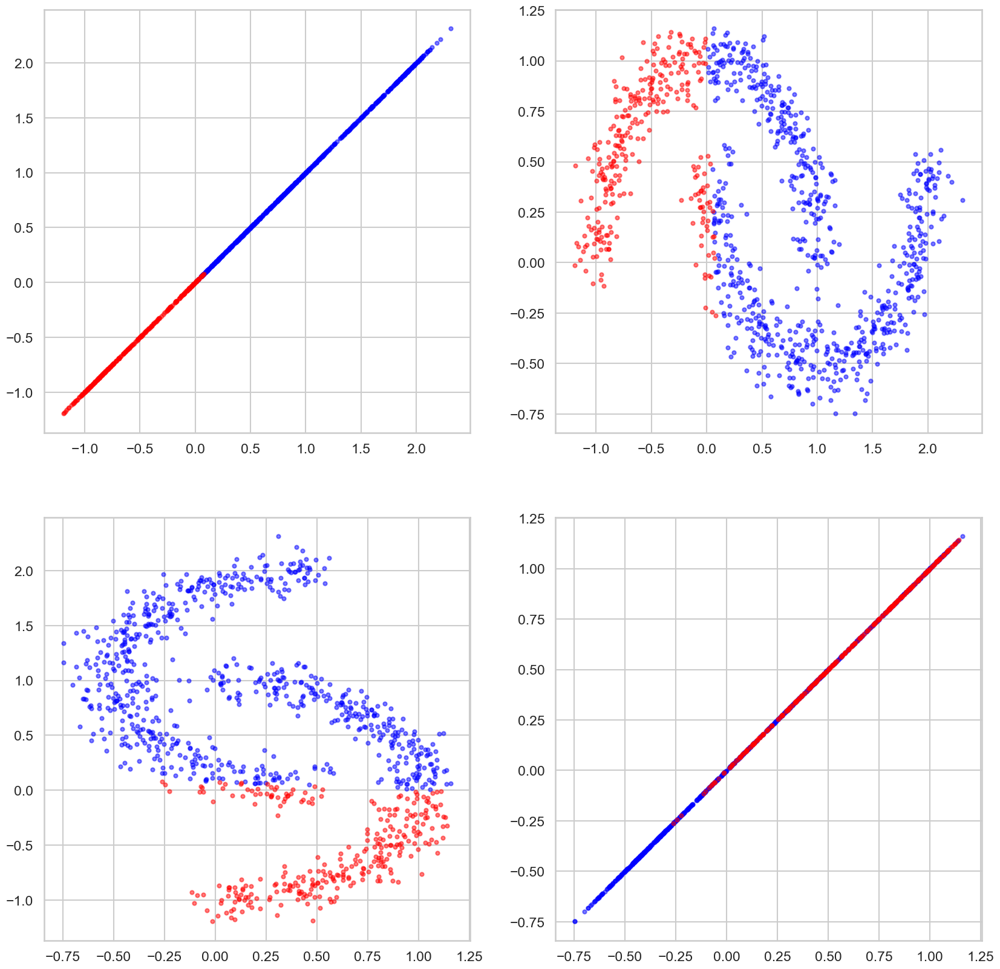

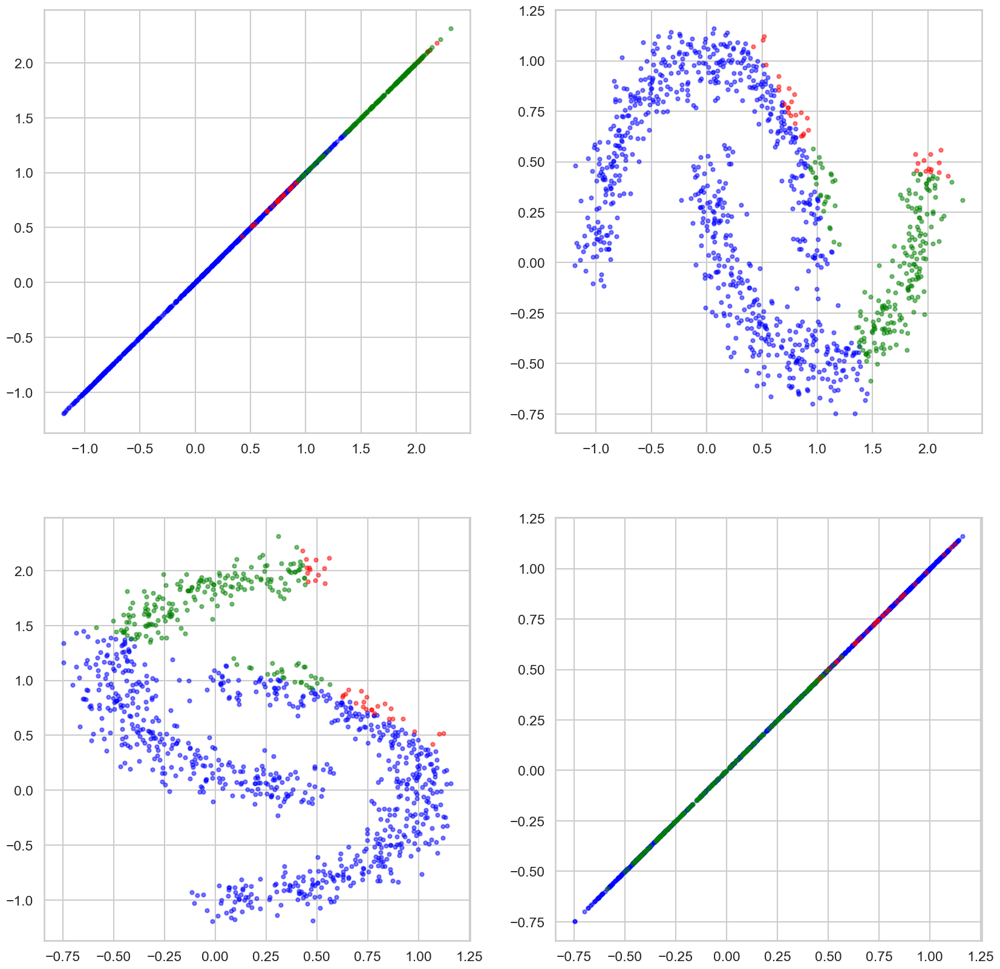

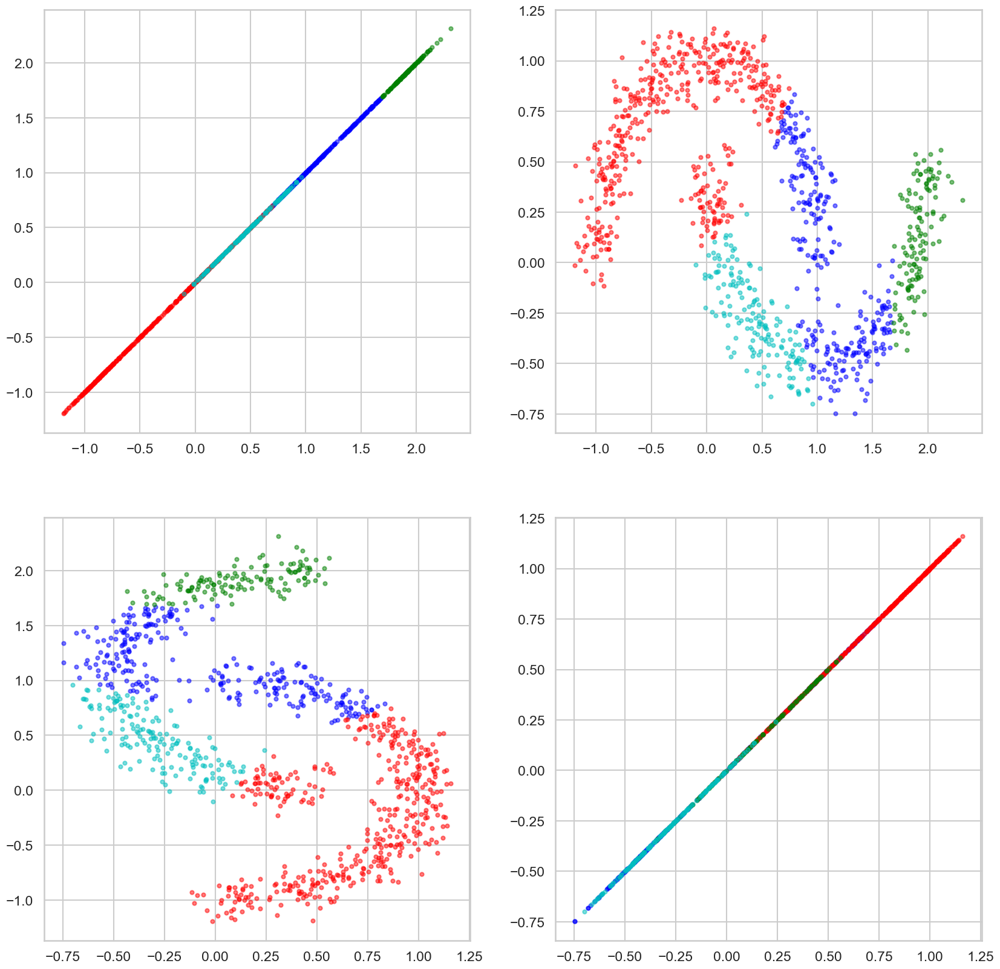

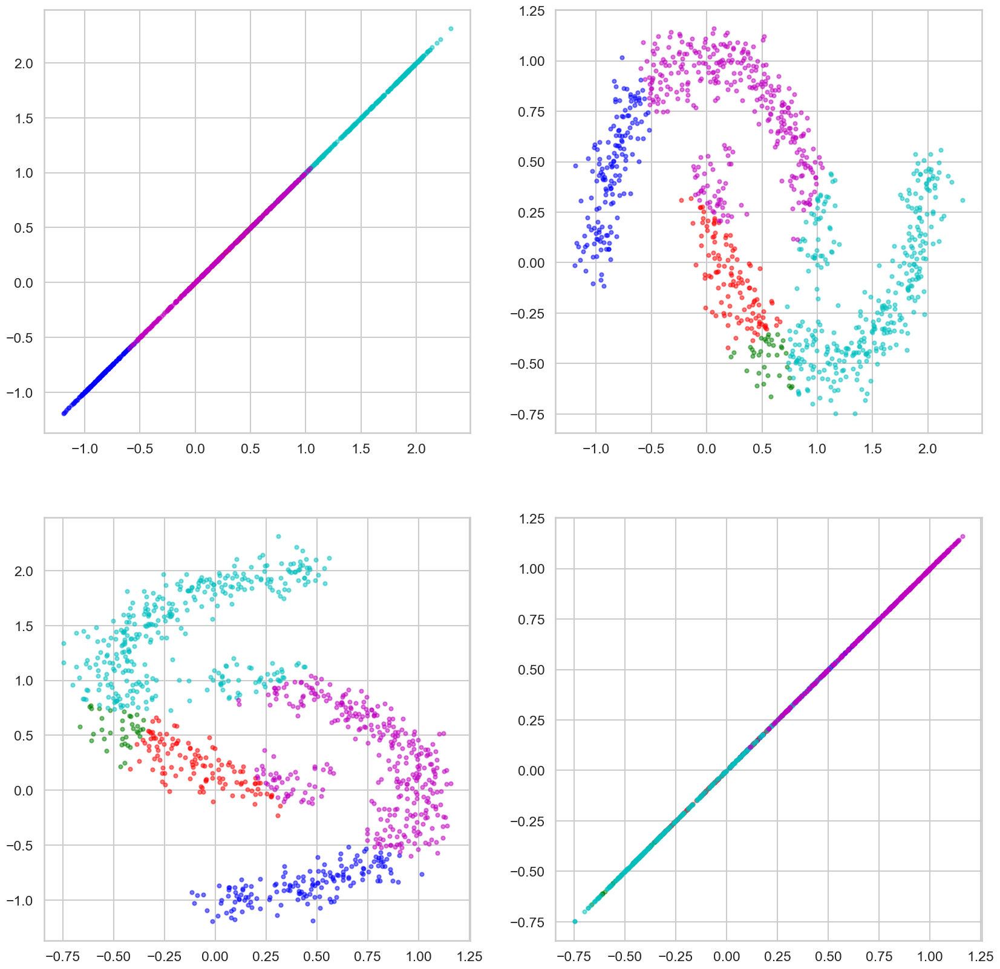

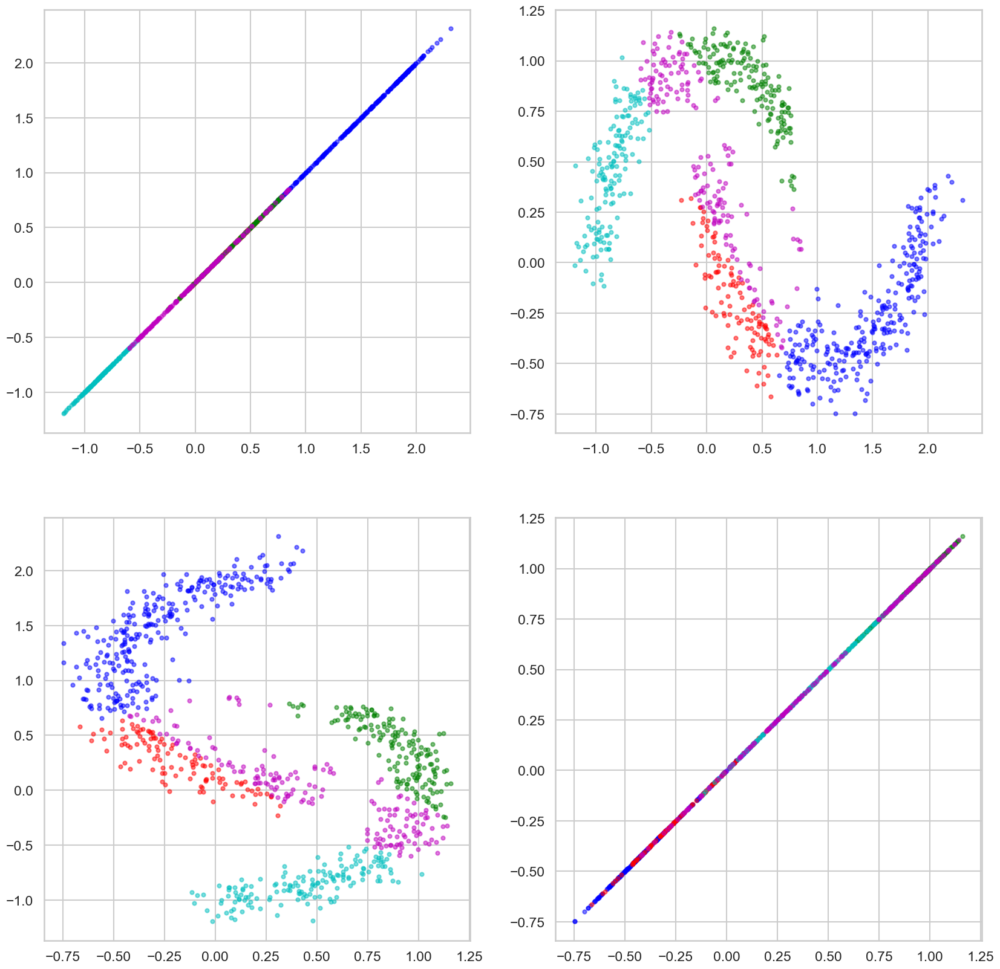

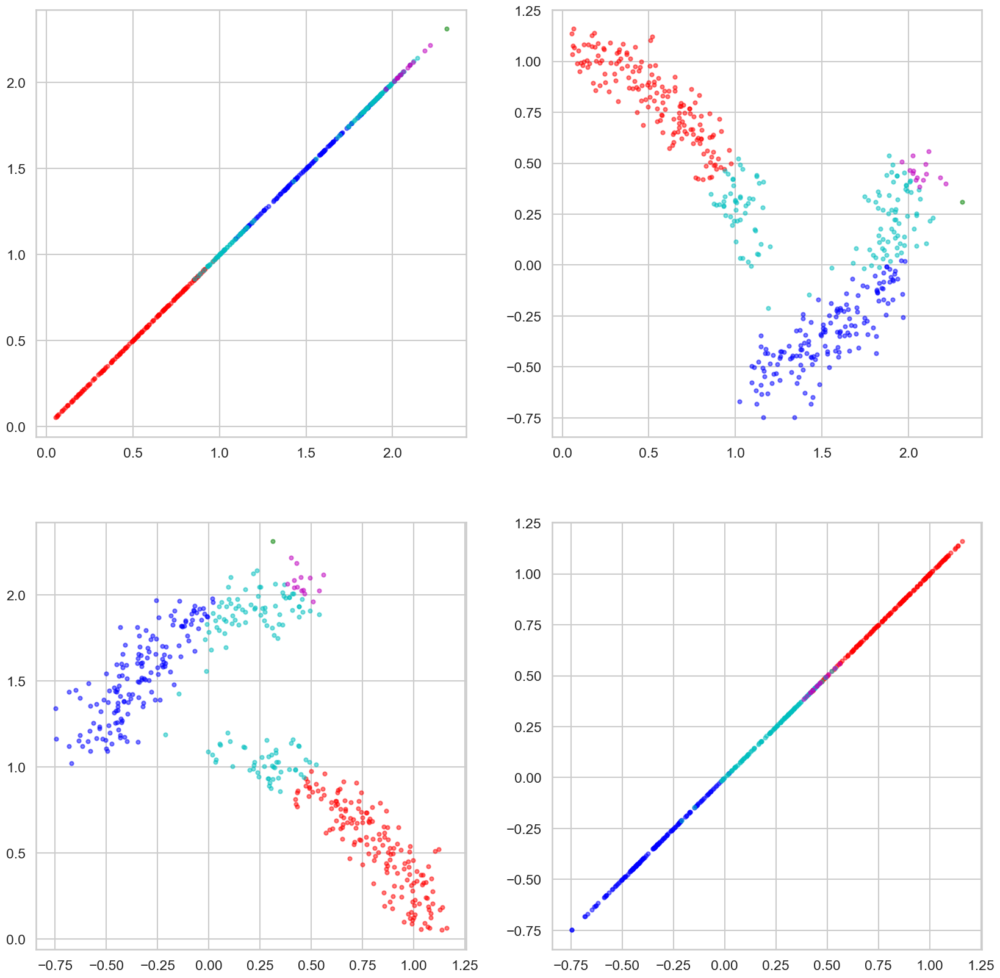

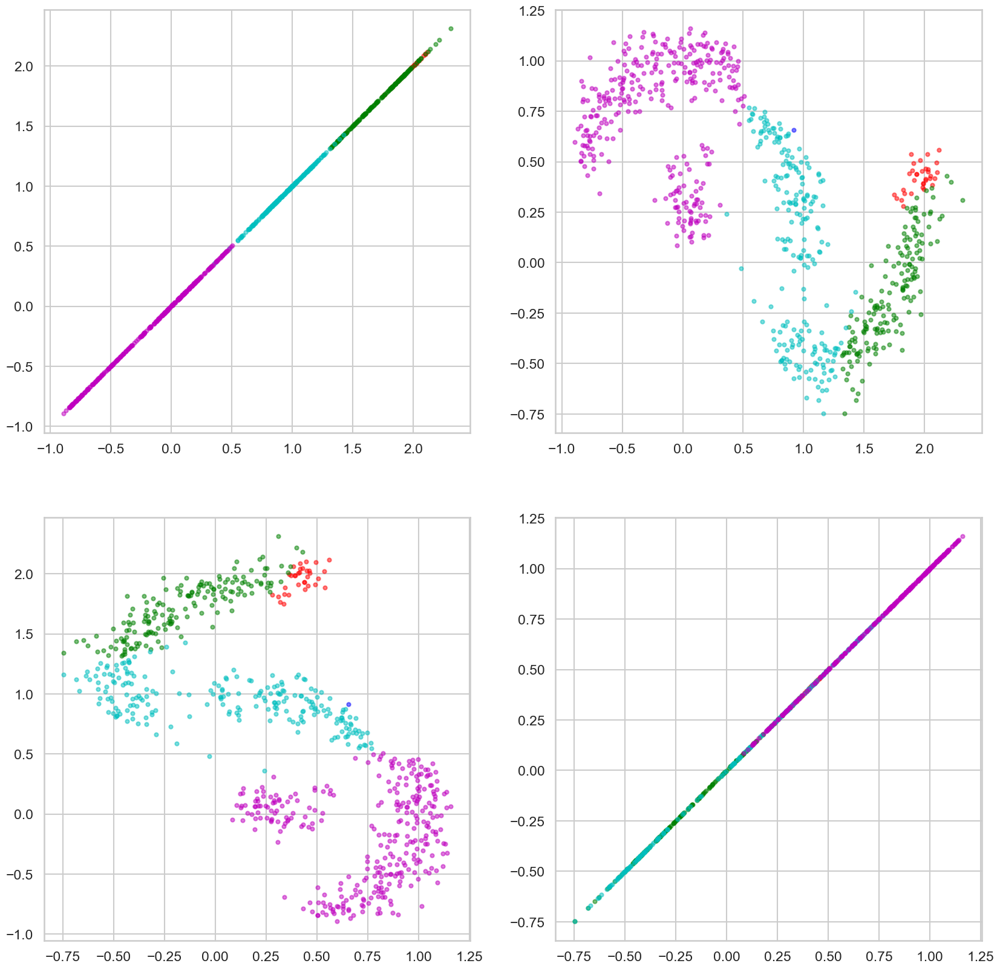

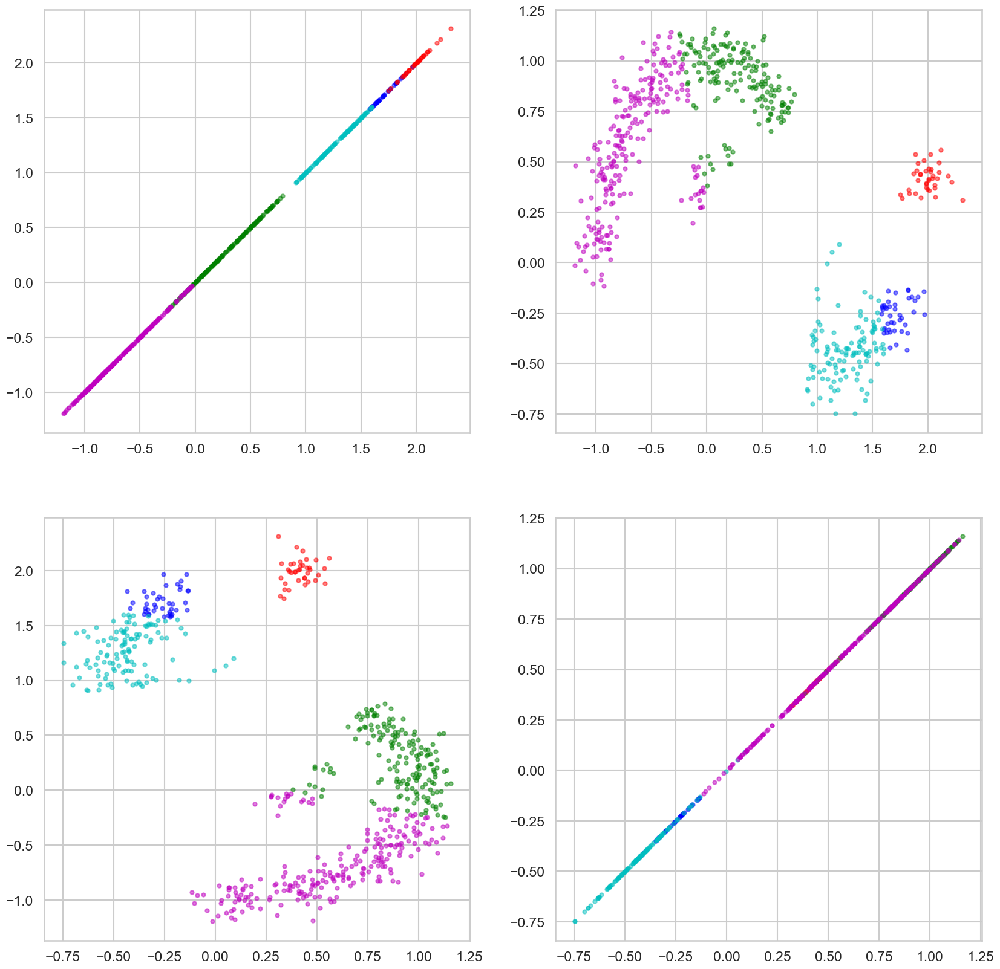

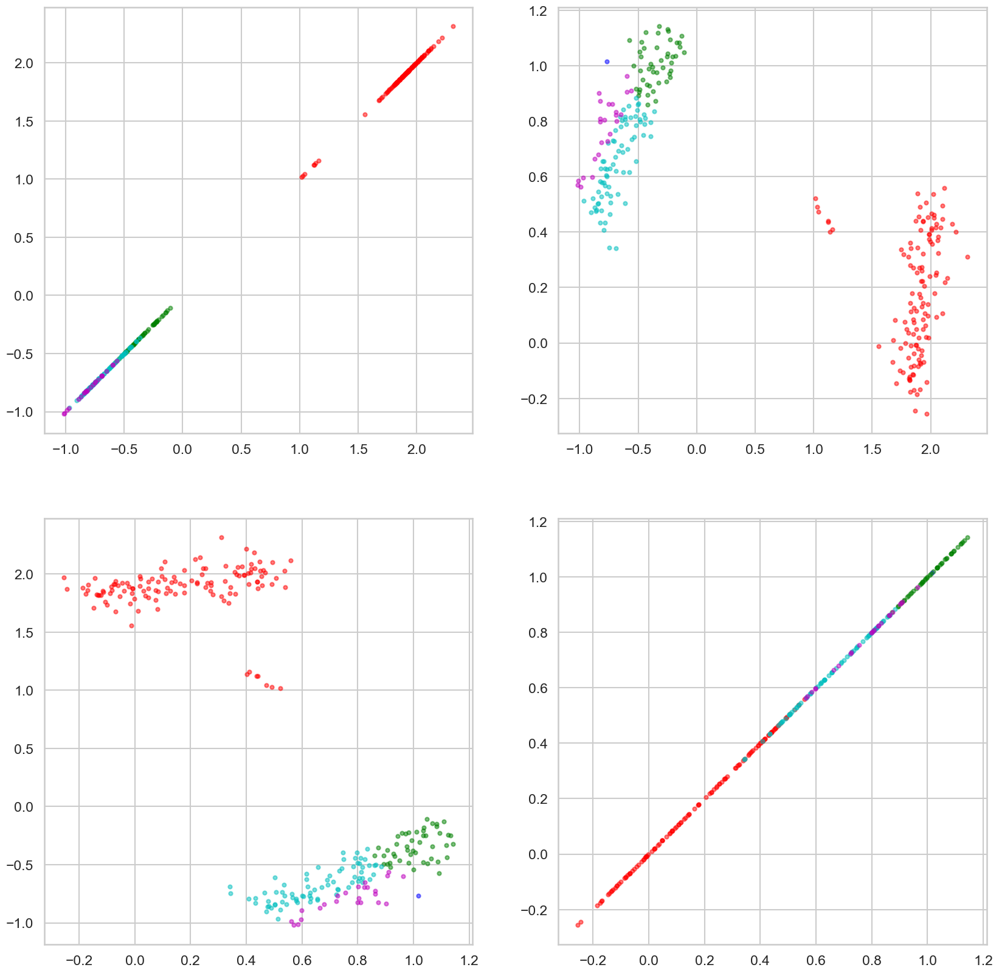

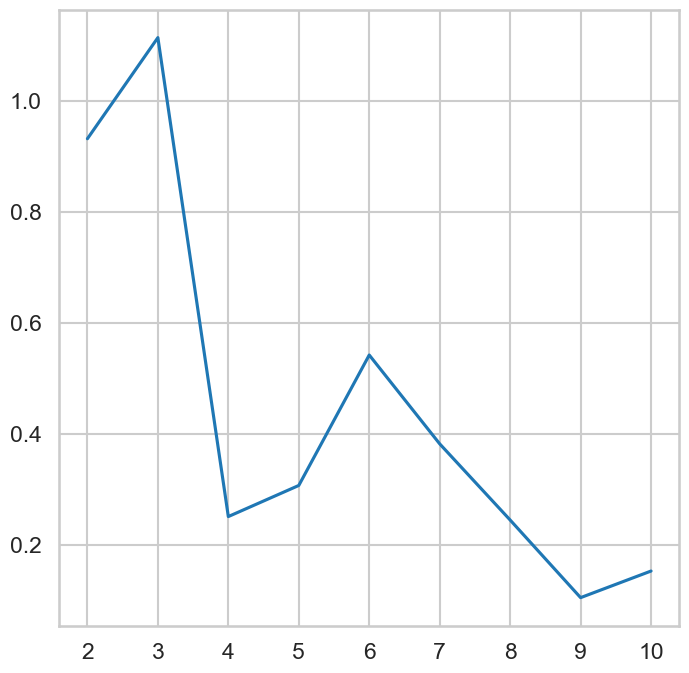

In [51]:
MSE_arr=np.array([])
n_samples = 1000
data2, y = noisy_moons = make_moons(n_samples=n_samples, noise= .1)
for i in range(2,11):
    print(i,"clusters, for euclidean")
    points2clusters,MSE=GUC_Kmean(data2,i,'euclidean') 
    print(points2clusters)
    print(MSE)
    MSE_arr=np.append(MSE_arr,MSE)
    display(data2,points2clusters,k)
x_values = np.arange(2, 2 + MSE_arr.shape[0])
plt.figure()
plt.plot(x_values,MSE_arr)

## 4. Using the GUC_Kmean function to segment customers int he provided customer dataset
1. Apply the GUC_Kmean fucntion to customer data  
2. Try a varing number of cluster that range from 2 to 10 cluster on each set 
3. Display your results.
4. plot the Cluster Metric versus the number of clusters
4. Change the distance function and repeat the above steps 

2 clusters, for Pearson
[[0.00000000e+00 2.11583857e-08]
 [1.00000000e+00 1.89231959e-08]
 [0.00000000e+00 1.05594654e-08]
 ...
 [0.00000000e+00 1.49866430e-08]
 [0.00000000e+00 1.71698933e-09]
 [0.00000000e+00 6.16528909e-08]]
773052108.4870063
[0. 1. 0. ... 0. 0. 0.]
3 clusters, for Pearson
[[2.00000000e+00 6.80411616e-09]
 [2.00000000e+00 1.00639040e-08]
 [1.00000000e+00 6.39865716e-10]
 ...
 [1.00000000e+00 2.02104422e-09]
 [1.00000000e+00 1.29797773e-09]
 [1.00000000e+00 2.91849679e-08]]
557198758.9905145
[2. 2. 1. ... 1. 1. 1.]
4 clusters, for Pearson
[[2.00000000e+00 3.08233816e-09]
 [0.00000000e+00 2.93239866e-09]
 [1.00000000e+00 3.64670916e-09]
 ...
 [1.00000000e+00 1.65869907e-09]
 [1.00000000e+00 1.48134653e-08]
 [1.00000000e+00 7.25102189e-09]]
359758243.2110343
[2. 0. 1. ... 1. 1. 1.]
5 clusters, for Pearson
[[3.00000000e+00 1.05899001e-09]
 [4.00000000e+00 2.07783146e-09]
 [2.00000000e+00 9.11883791e-10]
 ...
 [2.00000000e+00 1.11016307e-10]
 [2.00000000e+00 8.37588798e-

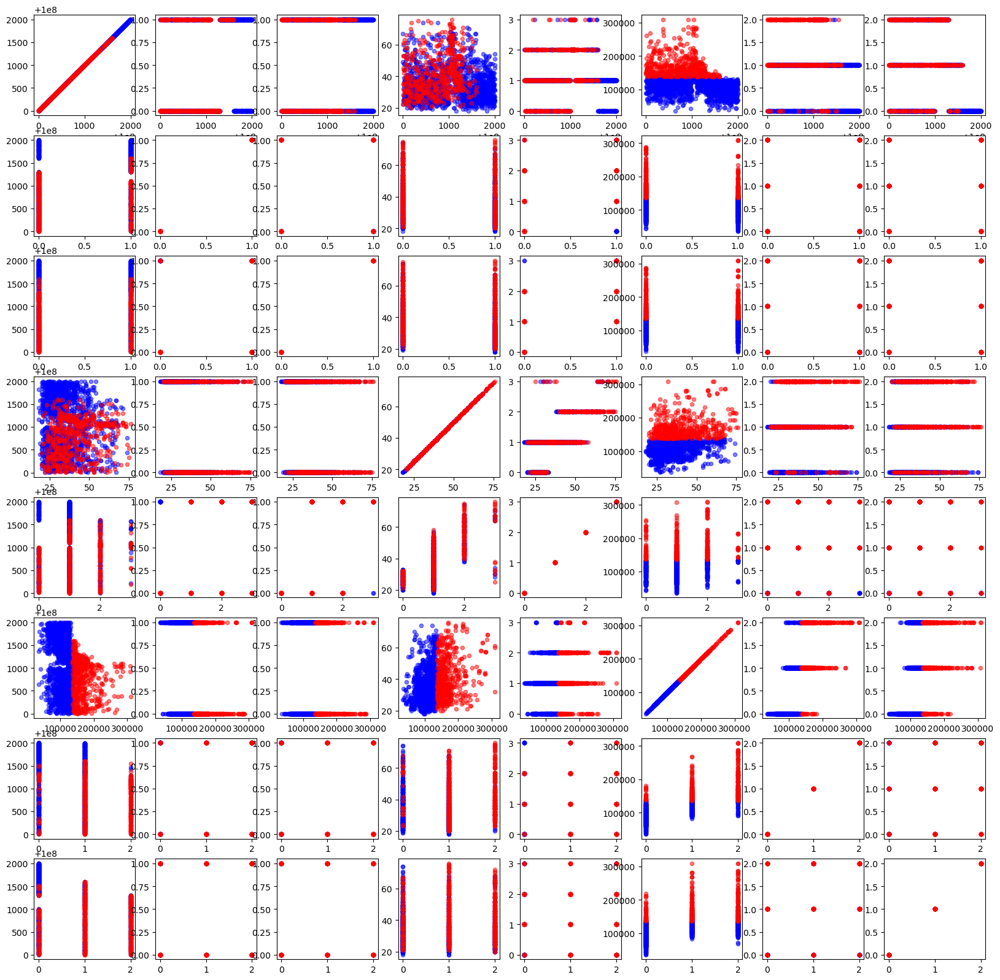

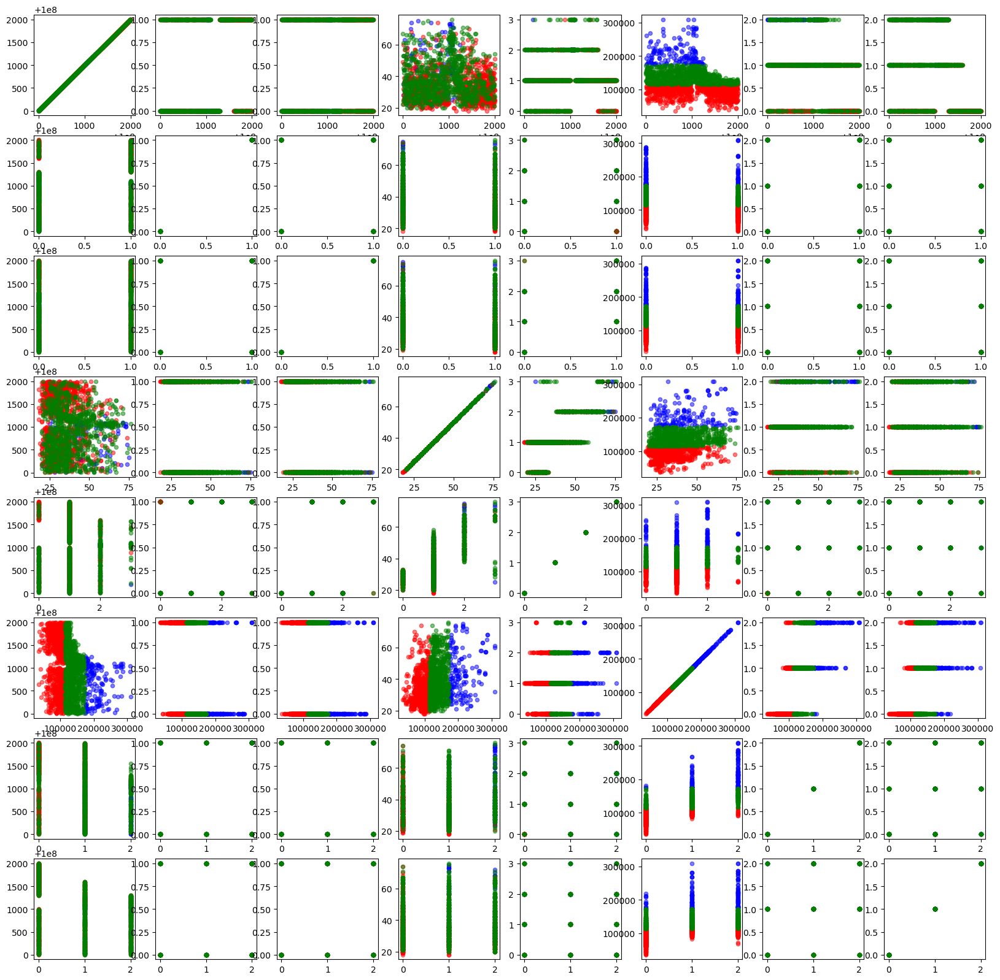

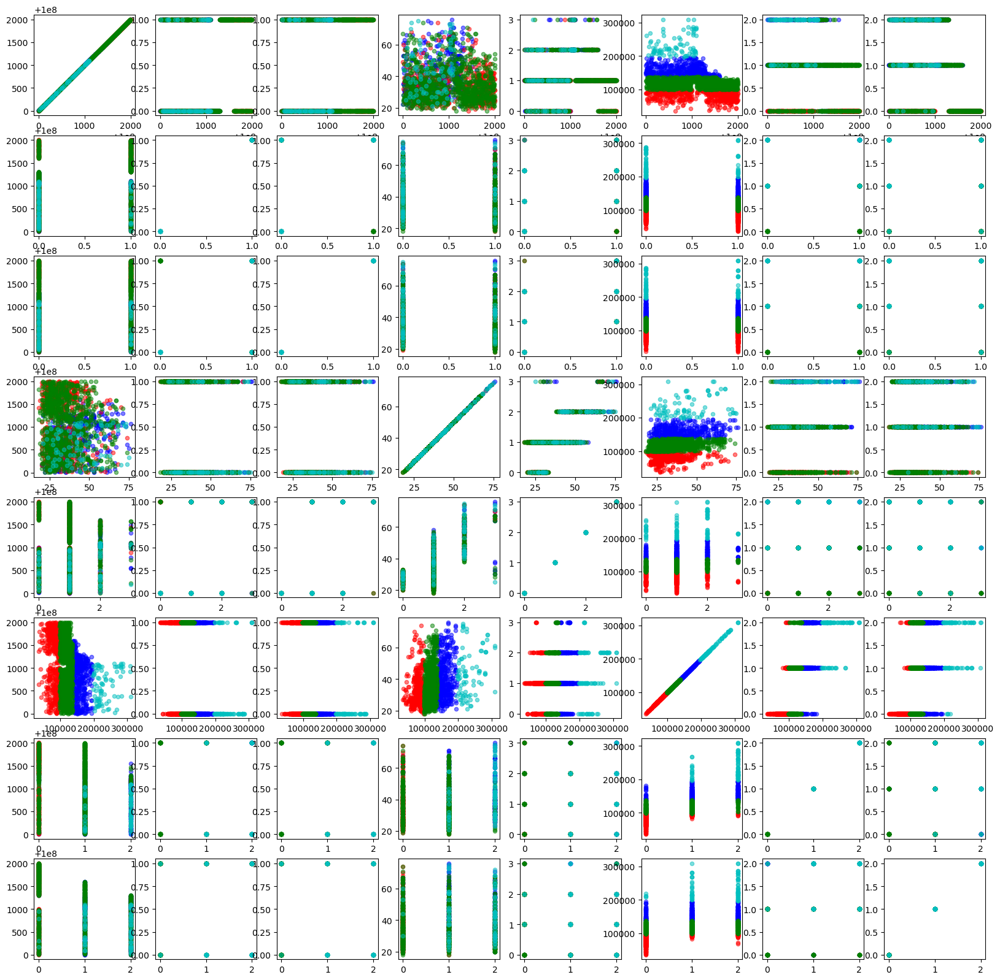

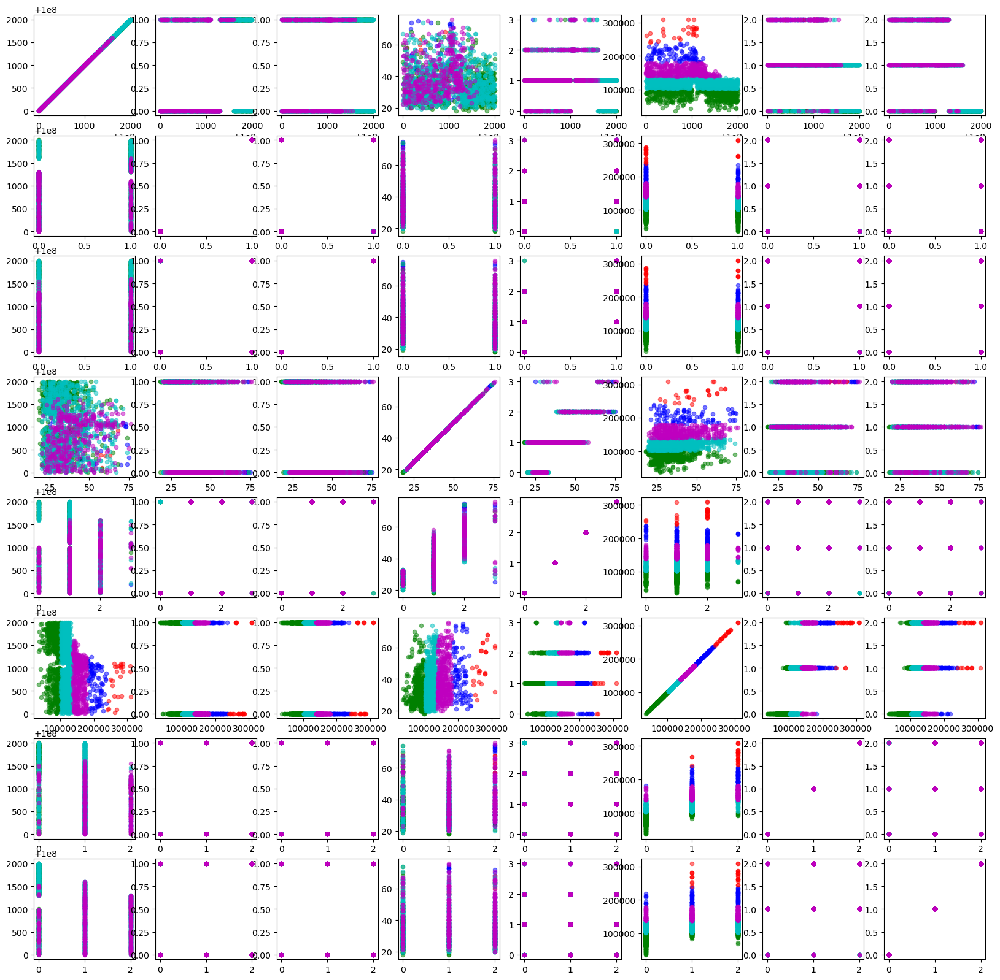

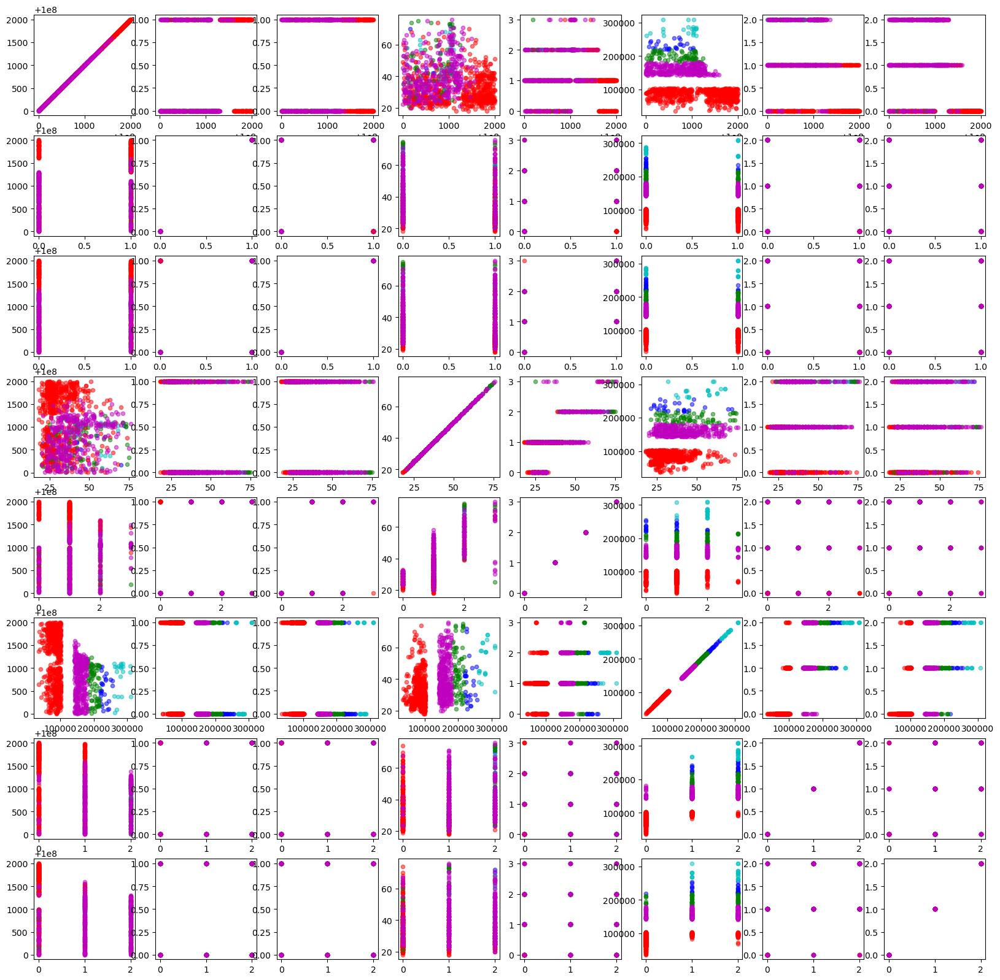

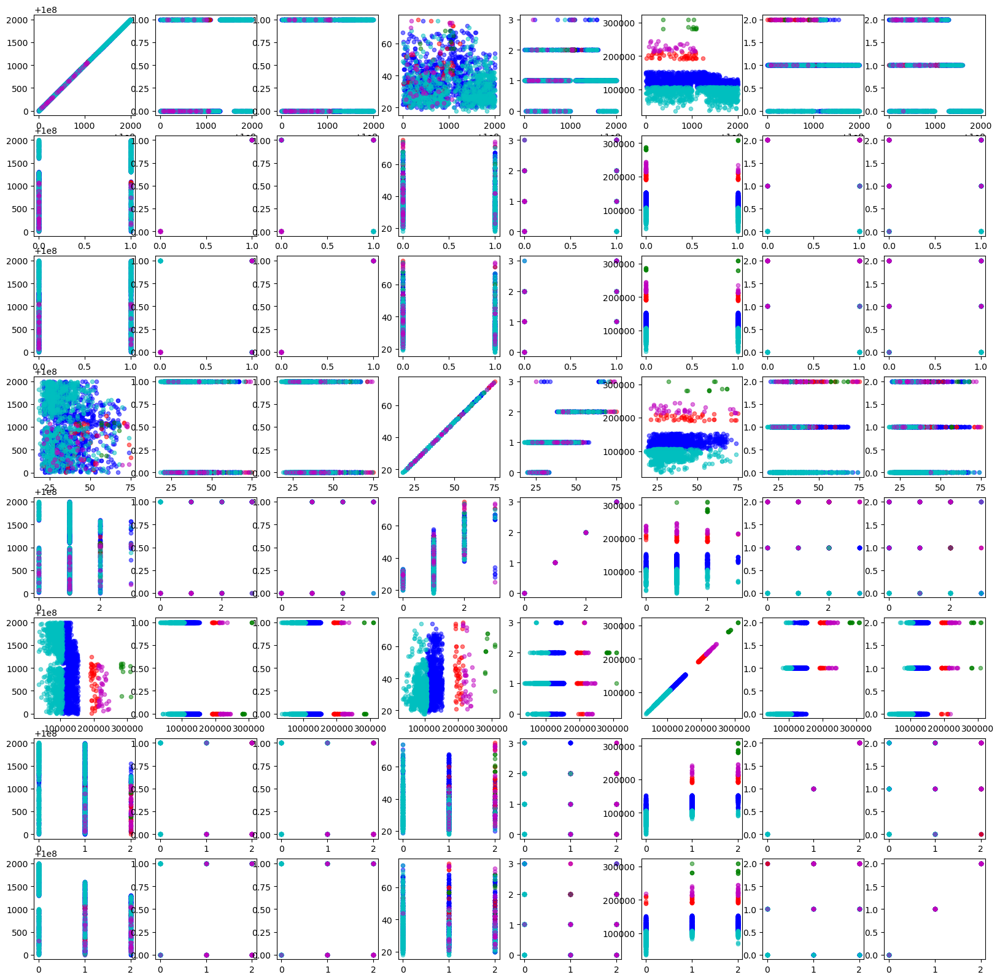

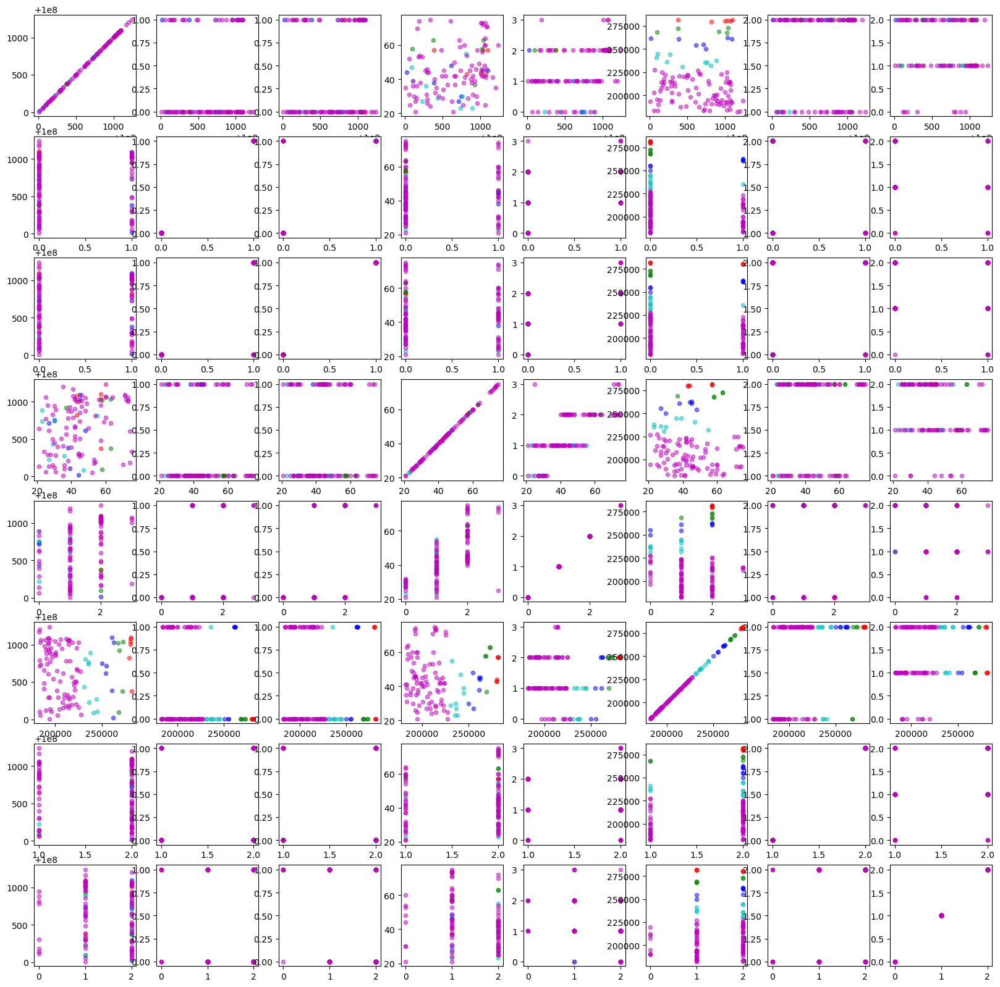

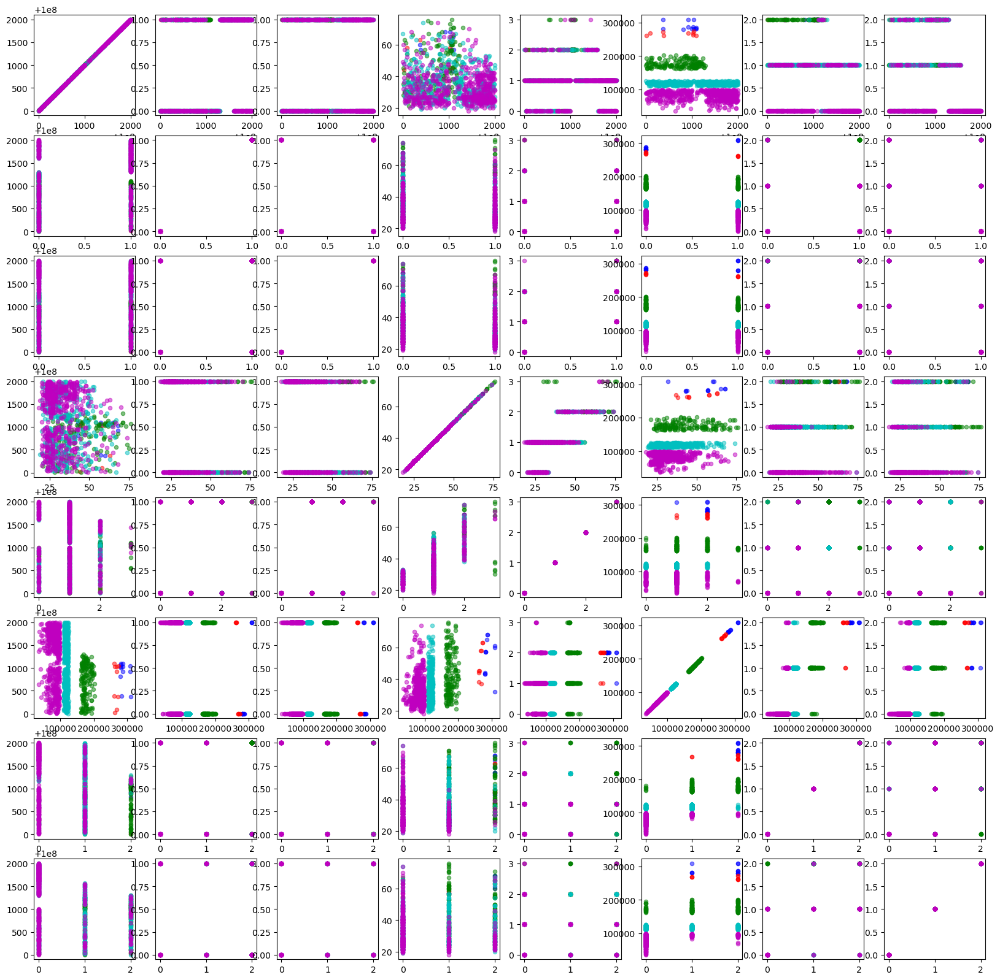

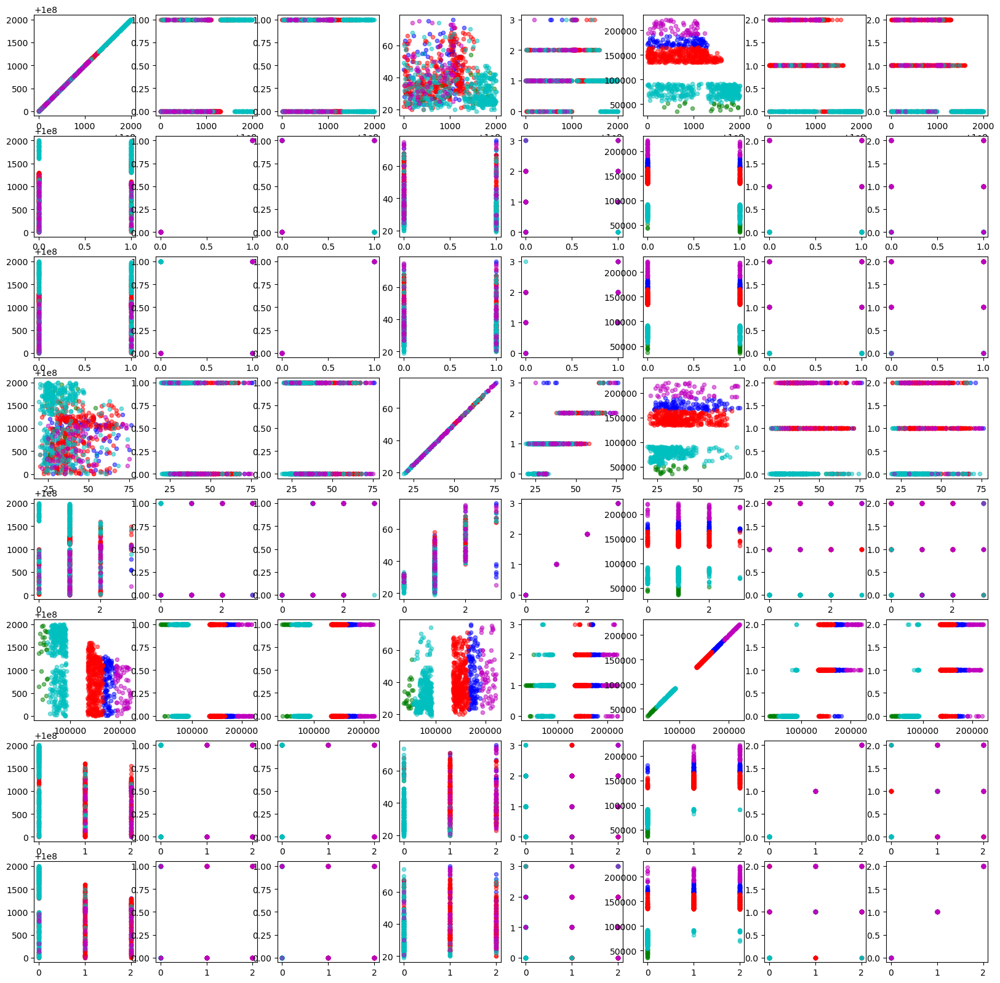

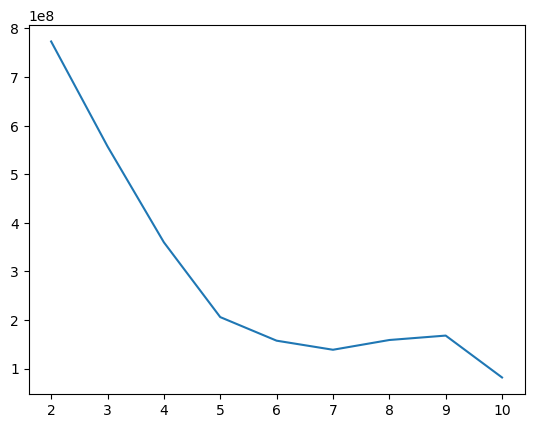

In [22]:
MSE_arr=np.array([])
for i in range(2,11):
    print(i,"clusters, for Pearson")
    points2clusters,MSE=GUC_Kmean(data_array,i,'pearson') 
    print(points2clusters)
    print(MSE)
    MSE_arr=np.append(MSE_arr,MSE)
    display(data_array,points2clusters,k)
x_values = np.arange(2, 2 + MSE_arr.shape[0])
plt.figure()
plt.plot(x_values,MSE_arr)

2 clusters, for euclidean
[[0.00000000e+00 2.07659821e+04]
 [1.00000000e+00 1.97946897e+04]
 [0.00000000e+00 1.47628043e+04]
 ...
 [0.00000000e+00 1.75561158e+04]
 [0.00000000e+00 6.03341203e+03]
 [0.00000000e+00 3.55282980e+04]]
773516031.8513024
[0. 1. 0. ... 0. 0. 0.]
3 clusters, for euclidean
[[2.00000000e+00 1.18113275e+04]
 [2.00000000e+00 1.43519165e+04]
 [0.00000000e+00 3.79190049e+03]
 ...
 [0.00000000e+00 6.47685230e+03]
 [0.00000000e+00 5.21443296e+03]
 [0.00000000e+00 2.44205698e+04]]
557198758.9905145
[2. 2. 0. ... 0. 0. 0.]
4 clusters, for euclidean
[[0.00000000e+00 7.99962752e+03]
 [1.00000000e+00 7.77510920e+03]
 [2.00000000e+00 8.71365589e+03]
 ...
 [2.00000000e+00 5.86984377e+03]
 [2.00000000e+00 1.74035589e+04]
 [2.00000000e+00 1.21907966e+04]]
359758243.2110343
[0. 1. 2. ... 2. 2. 2.]
5 clusters, for euclidean
[[1.00000000e+00 3.12199422e+03]
 [0.00000000e+00 1.75378449e+04]
 [2.00000000e+00 1.65809660e+03]
 ...
 [2.00000000e+00 4.07952764e+03]
 [2.00000000e+00 7.62

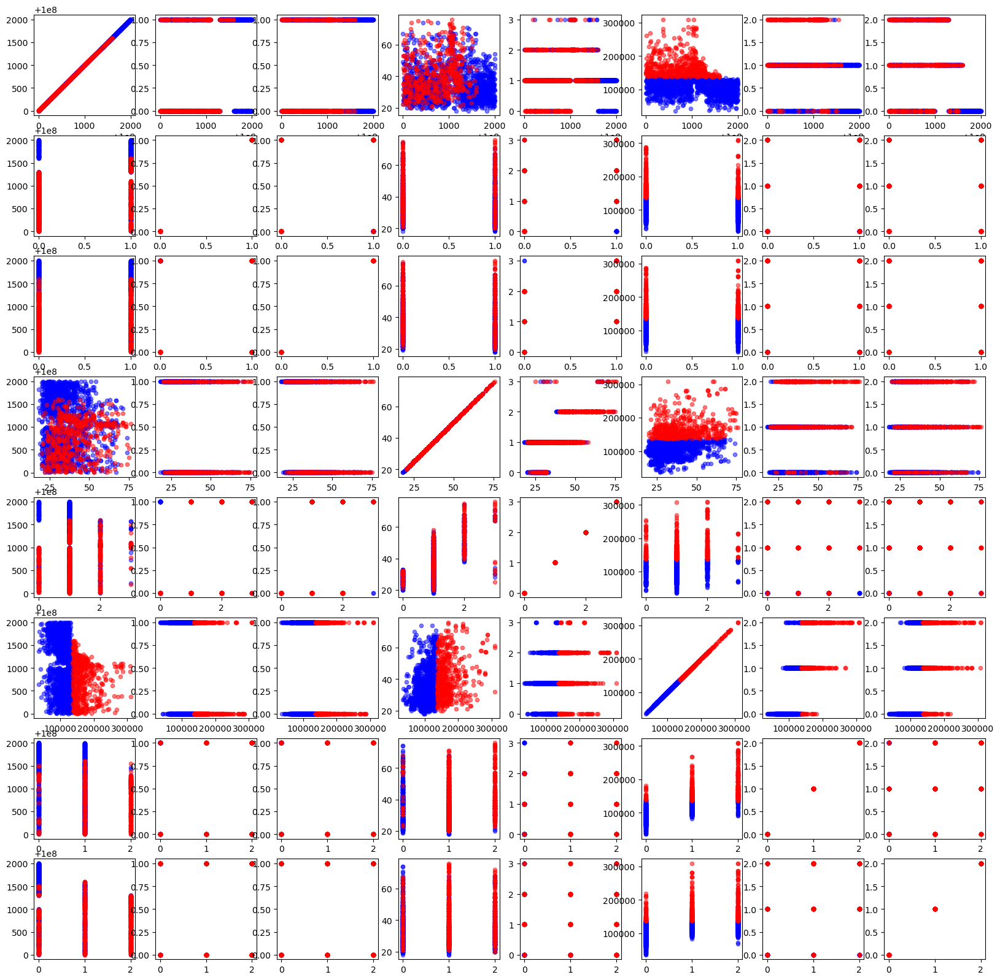

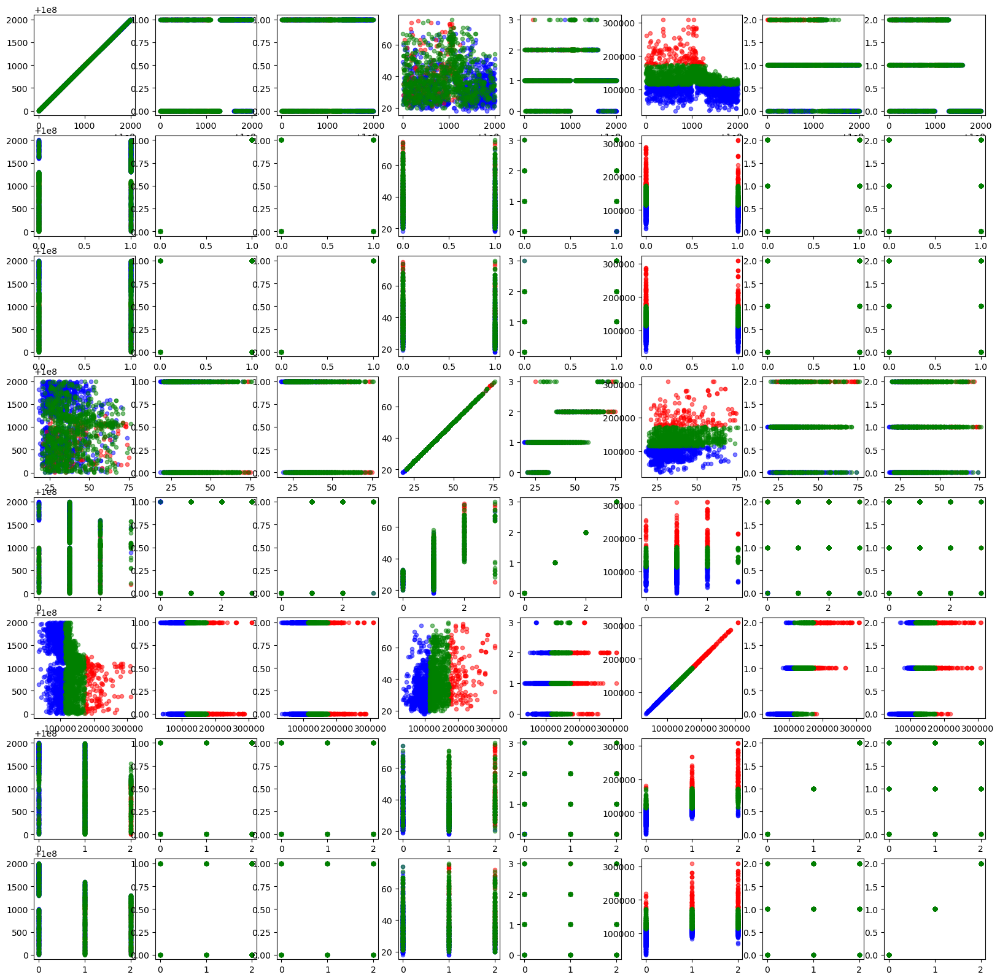

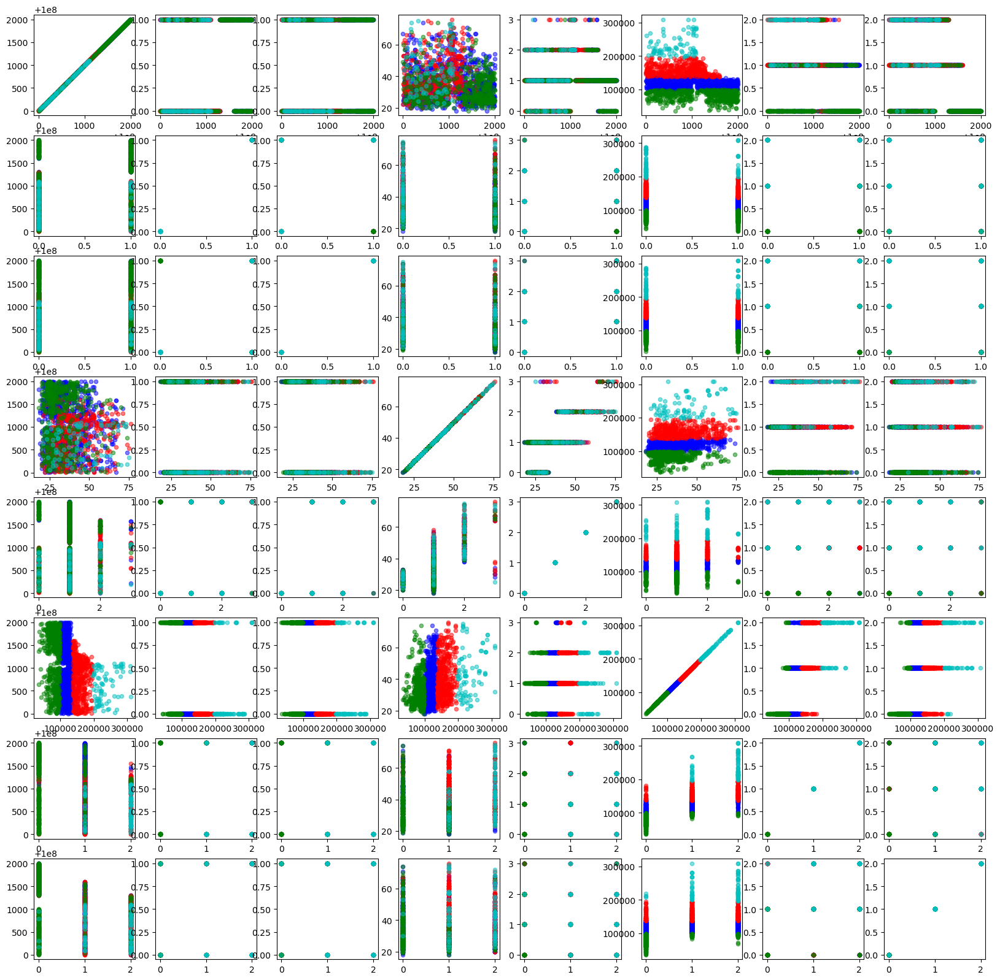

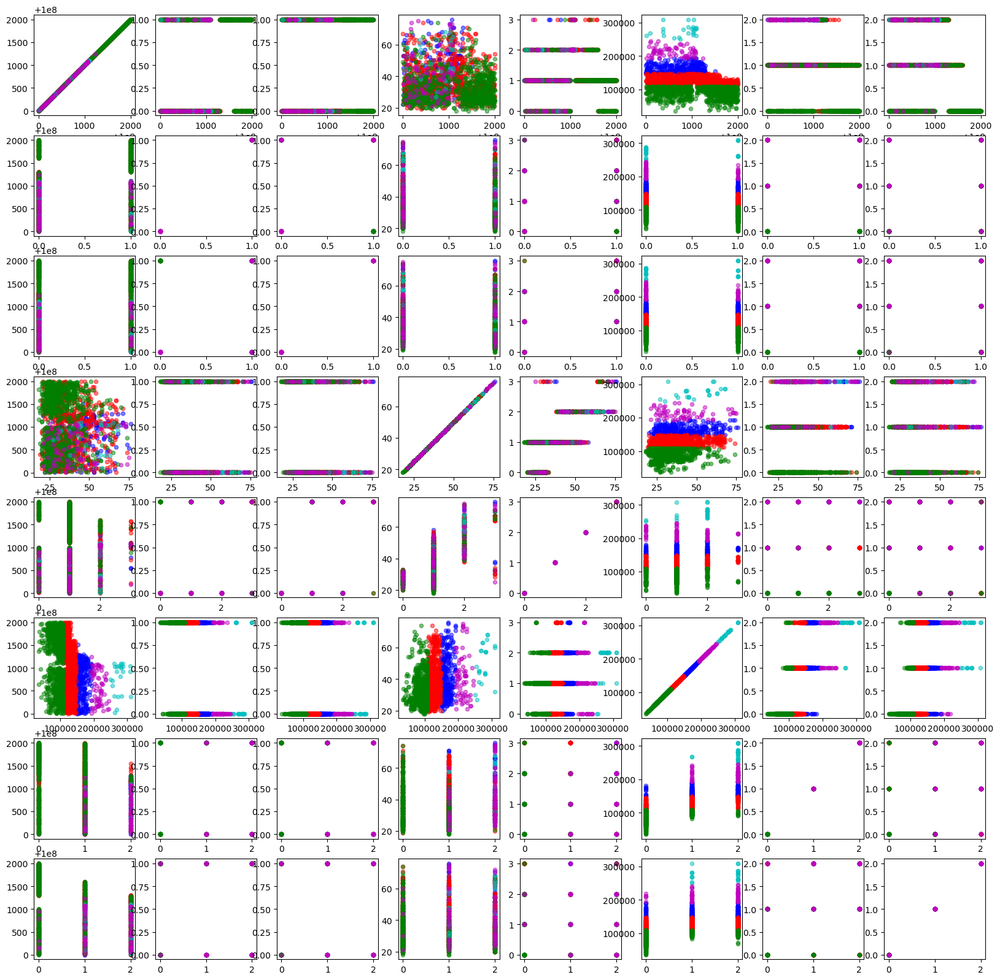

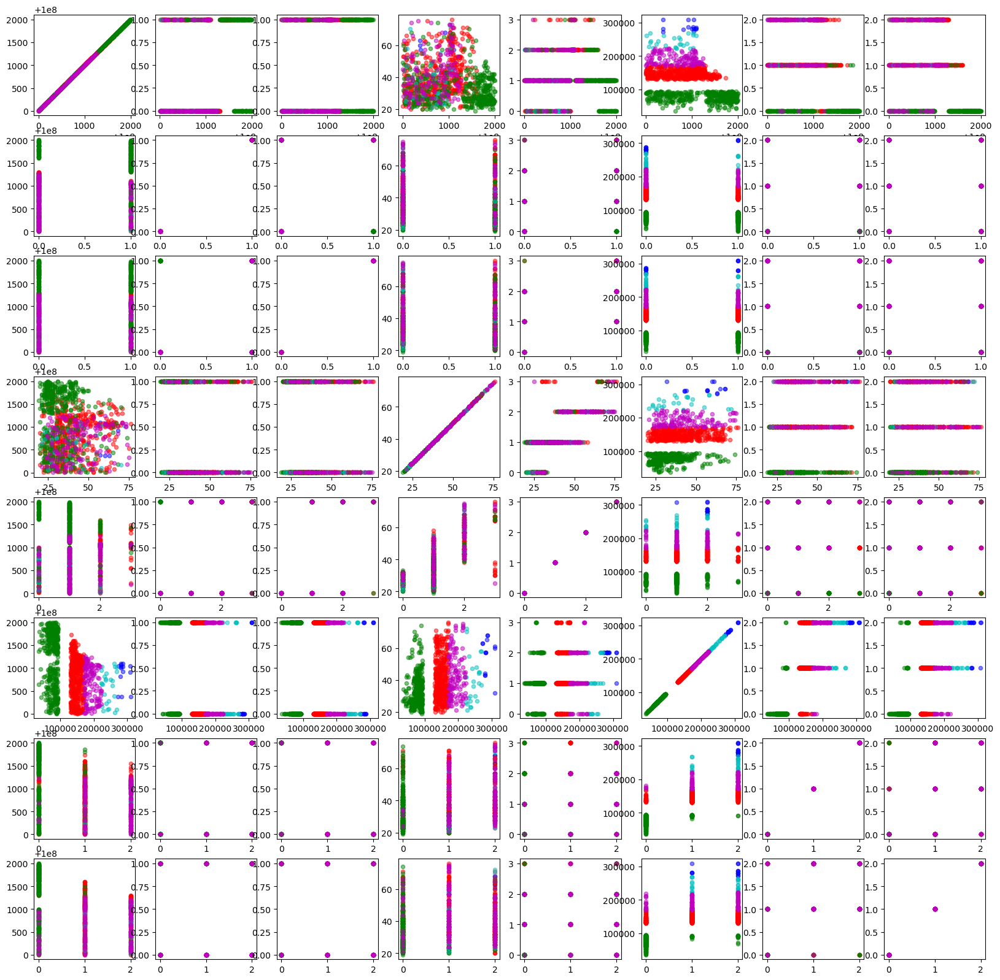

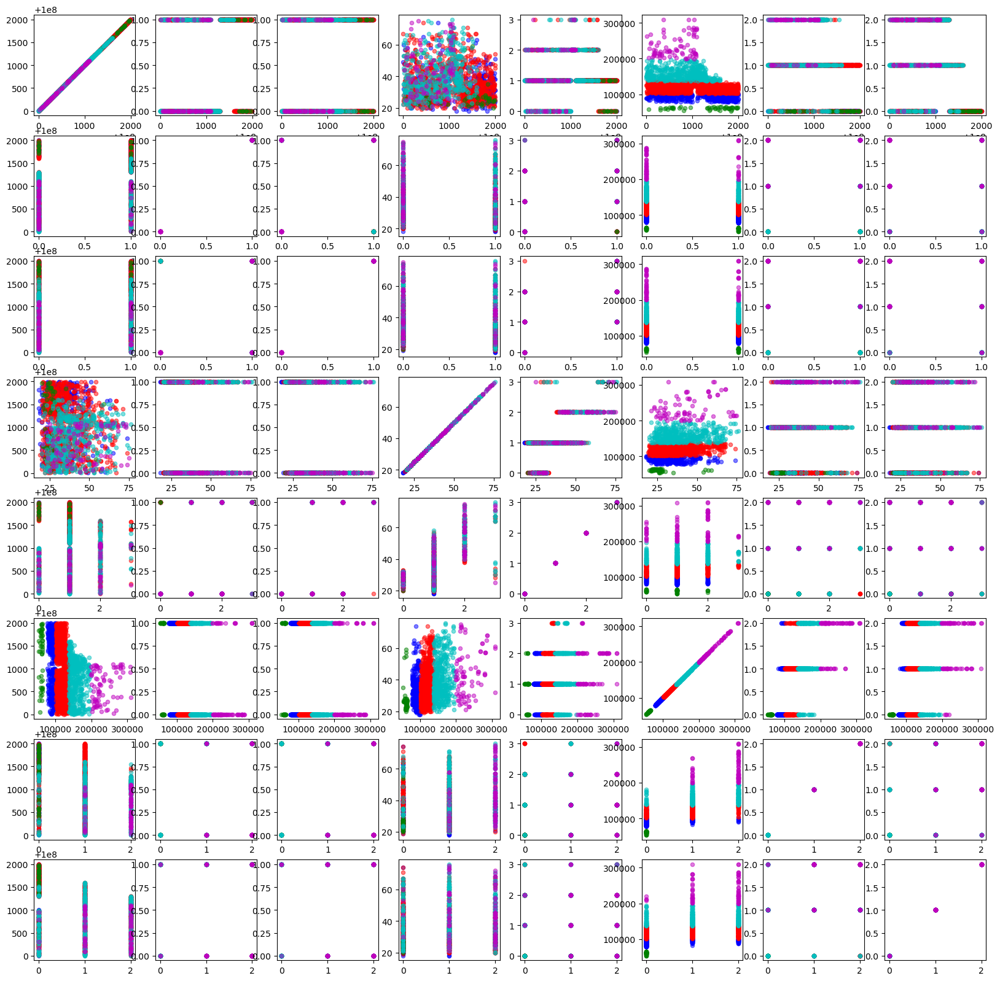

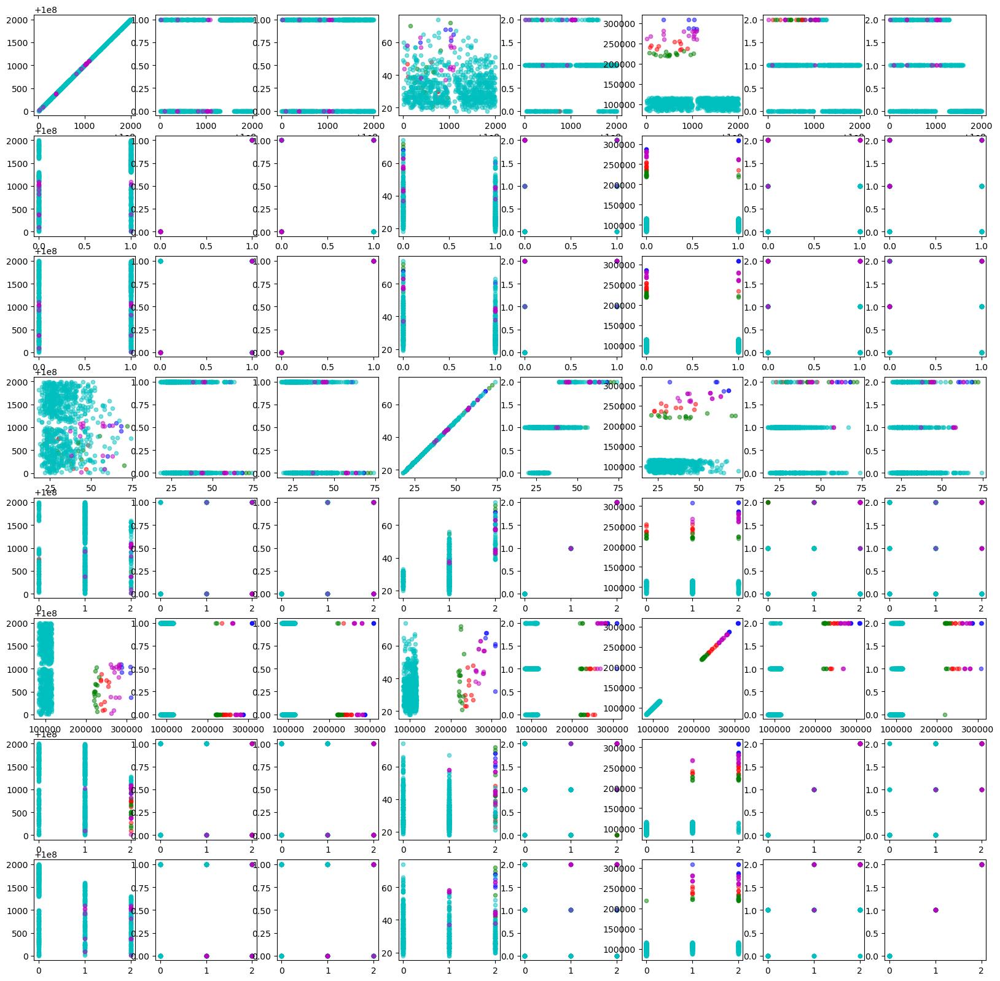

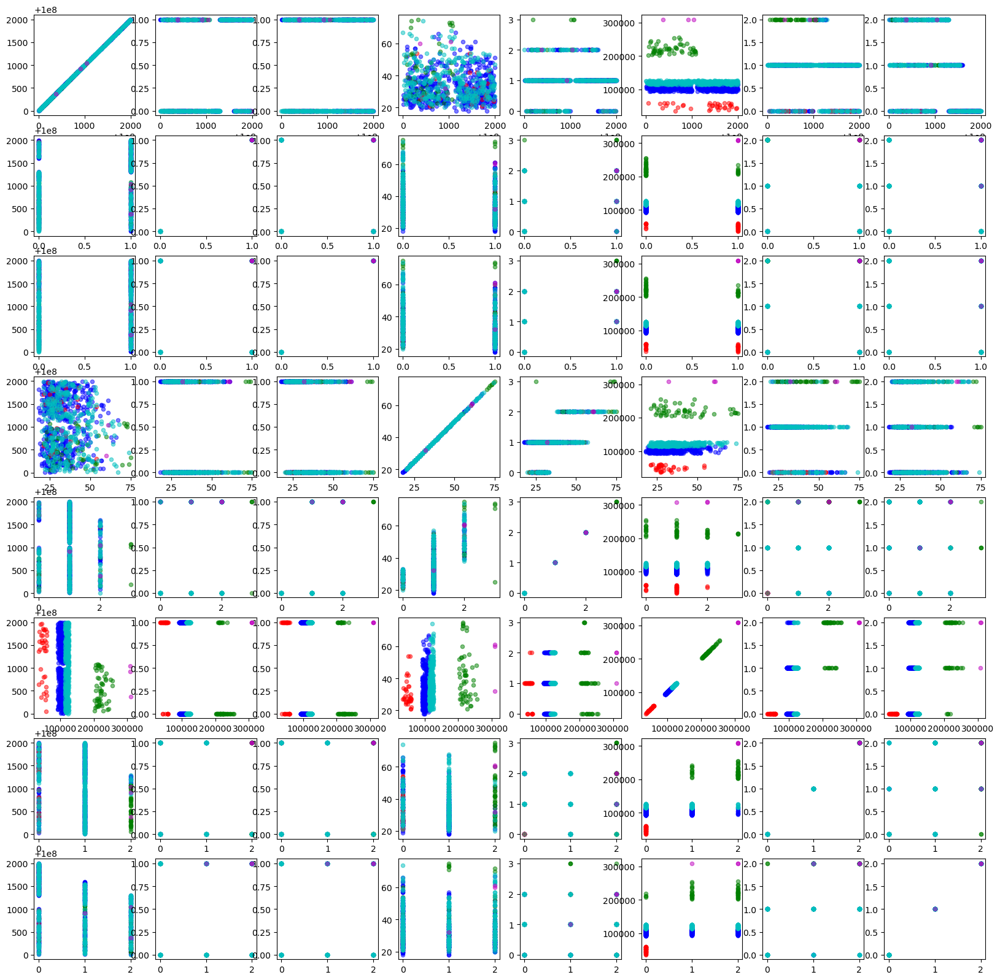

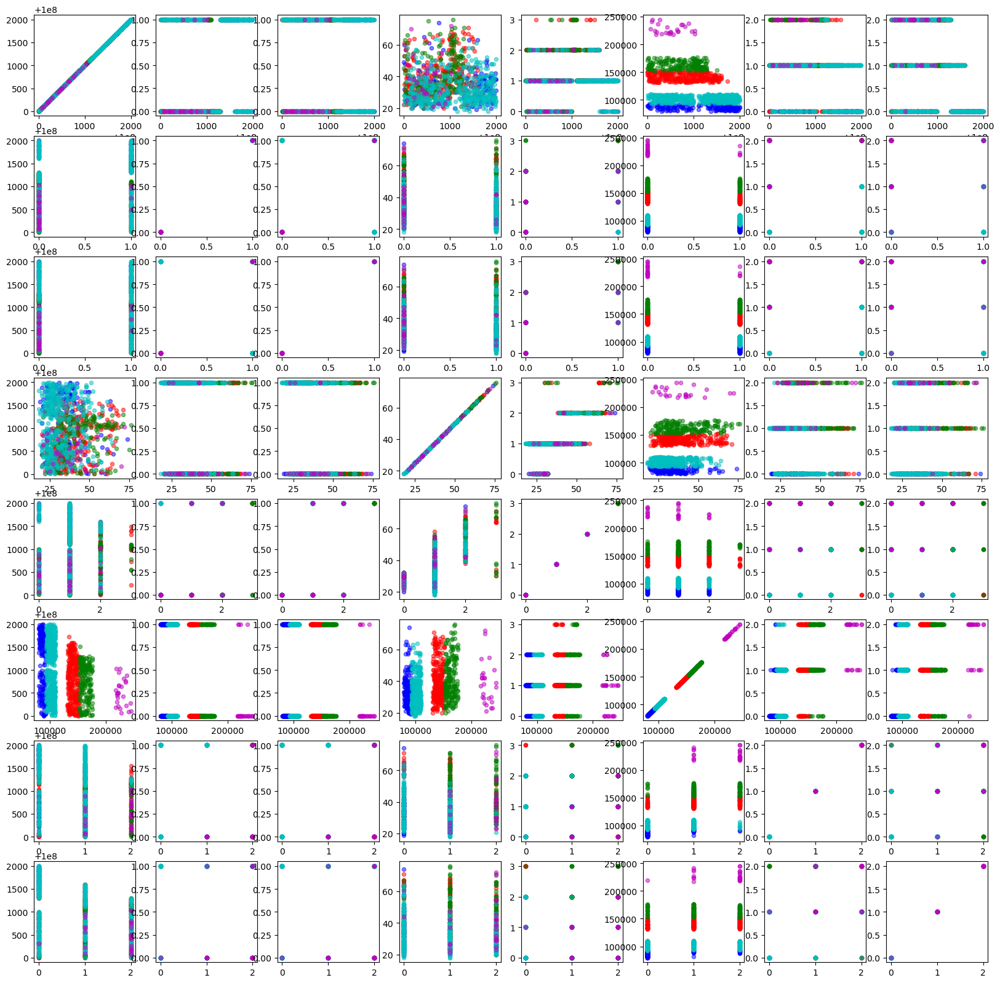

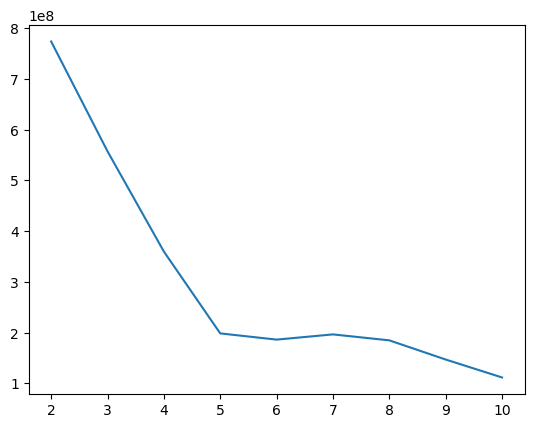

In [23]:
MSE_arr=np.array([])
for i in range(2,11):
    print(i,"clusters, for euclidean")
    points2clusters,MSE=GUC_Kmean(data_array,i,'euclidean') 
    print(points2clusters)
    print(MSE)
    MSE_arr=np.append(MSE_arr,MSE)
    display(data_array,points2clusters,k)
x_values = np.arange(2, 2 + MSE_arr.shape[0])
plt.figure()
plt.plot(x_values,MSE_arr)